In [1]:
#importing libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import math
import io
import plotly.graph_objs as go

In [2]:
from google.colab import files
uploaded = files.upload()

Saving players_22.csv to players_22.csv


In [3]:
#loading dataset into python environment
df=pd.read_csv(io.BytesIO(uploaded['players_22.csv']))

<ipython-input-3-04b759efe555>:2: DtypeWarning: Columns (25,108) have mixed types. Specify dtype option on import or set low_memory=False.
  df=pd.read_csv(io.BytesIO(uploaded['players_22.csv']))


 **EDA**

In [4]:
#display first 5 rows
df.head(5)

,sofifa_id,player_url,short_name,long_name,player_positions,overall,potential,value_eur,wage_eur,age,...,lcb,cb,rcb,rb,gk,player_face_url,club_logo_url,club_flag_url,nation_logo_url,nation_flag_url
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,"RW, ST, CF",93,93,78000000.0,320000.0,34,...,50+3,50+3,50+3,61+3,19+3,https://cdn.sofifa.net/players/158/023/22_120.png,https://cdn.sofifa.net/teams/73/60.png,https://cdn.sofifa.net/flags/fr.png,https://cdn.sofifa.net/teams/1369/60.png,https://cdn.sofifa.net/flags/ar.png
1,188545,https://sofifa.com/player/188545/robert-lewand...,R. Lewandowski,Robert Lewandowski,ST,92,92,119500000.0,270000.0,32,...,60+3,60+3,60+3,61+3,19+3,https://cdn.sofifa.net/players/188/545/22_120.png,https://cdn.sofifa.net/teams/21/60.png,https://cdn.sofifa.net/flags/de.png,https://cdn.sofifa.net/teams/1353/60.png,https://cdn.sofifa.net/flags/pl.png
2,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,"ST, LW",91,91,45000000.0,270000.0,36,...,53+3,53+3,53+3,60+3,20+3,https://cdn.sofifa.net/players/020/801/22_120.png,https://cdn.sofifa.net/teams/11/60.png,https://cdn.sofifa.net/flags/gb-eng.png,https://cdn.sofifa.net/teams/1354/60.png,https://cdn.sofifa.net/flags/pt.png
3,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Júnior,"LW, CAM",91,91,129000000.0,270000.0,29,...,50+3,50+3,50+3,62+3,20+3,https://cdn.sofifa.net/players/190/871/22_120.png,https://cdn.sofifa.net/teams/73/60.png,https://cdn.sofifa.net/flags/fr.png,NaN,https://cdn.sofifa.net/flags/br.png
4,192985,https://sofifa.com/player/192985/kevin-de-bruy...,K. De Bruyne,Kevin De Bruyne,"CM, CAM",91,91,125500000.0,350000.0,30,...,69+3,69+3,69+3,75+3,21+3,https://cdn.sofifa.net/players/192/985/22_120.png,https://cdn.sofifa.net/teams/10/60.png,https://cdn.sofifa.net/flags/gb-eng.png,https://cdn.sofifa.net/teams/1325/60.png,https://cdn.sofifa.net/flags/be.png


In [5]:
#display information about the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19239 entries, 0 to 19238
Columns: 110 entries, sofifa_id to nation_flag_url
dtypes: float64(16), int64(44), object(50)
memory usage: 16.1+ MB


In [6]:
#count of rows and columns
df.shape

(19239, 110)

In [7]:
df.describe()

,sofifa_id,overall,potential,value_eur,wage_eur,age,height_cm,weight_kg,club_team_id,league_level,...,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed
count,19239.000000,19239.000000,19239.000000,1.916500e+04,19178.000000,19239.000000,19239.000000,19239.000000,19178.000000,19178.000000,...,19239.000000,19239.000000,19239.000000,19239.000000,19239.000000,19239.000000,19239.000000,19239.000000,19239.000000,2132.000000
mean,231468.086959,65.772182,71.079370,2.850452e+06,9017.989363,25.210822,181.299704,74.943032,50580.498123,1.354364,...,57.929830,46.601746,48.045584,45.906700,16.406102,16.192474,16.055356,16.229274,16.491814,36.439962
std,27039.717497,6.880232,6.086213,7.613700e+06,19470.176724,4.748235,6.863179,7.069434,54401.868535,0.747865,...,12.159326,20.200807,21.232718,20.755683,17.574028,16.839528,16.564554,17.059779,17.884833,10.751563
min,41.000000,47.000000,49.000000,9.000000e+03,500.000000,16.000000,155.000000,49.000000,1.000000,1.000000,...,12.000000,4.000000,5.000000,5.000000,2.000000,2.000000,2.000000,2.000000,2.000000,15.000000
25%,214413.500000,61.000000,67.000000,4.750000e+05,1000.000000,21.000000,176.000000,70.000000,479.000000,1.000000,...,50.000000,29.000000,28.000000,25.000000,8.000000,8.000000,8.000000,8.000000,8.000000,27.000000
50%,236543.000000,66.000000,71.000000,9.750000e+05,3000.000000,25.000000,181.000000,75.000000,1938.000000,1.000000,...,59.000000,52.000000,56.000000,53.000000,11.000000,11.000000,11.000000,11.000000,11.000000,36.000000
75%,253532.500000,70.000000,75.000000,2.000000e+06,8000.000000,29.000000,186.000000,80.000000,111139.000000,1.000000,...,66.000000,63.000000,65.000000,63.000000,14.000000,14.000000,14.000000,14.000000,14.000000,45.000000
max,264640.000000,93.000000,95.000000,1.940000e+08,350000.000000,54.000000,206.000000,110.000000,115820.000000,5.000000,...,96.000000,93.000000,93.000000,92.000000,91.000000,92.000000,93.000000,92.000000,90.000000,65.000000


In [8]:
#display numerical columns
df1=df.select_dtypes(include='number')
df1

,sofifa_id,overall,potential,value_eur,wage_eur,age,height_cm,weight_kg,club_team_id,league_level,...,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed
0,158023,93,93,78000000.0,320000.0,34,170,72,73.0,1.0,...,96,20,35,24,6,11,15,14,8,NaN
1,188545,92,92,119500000.0,270000.0,32,185,81,21.0,1.0,...,88,35,42,19,15,6,12,8,10,NaN
2,20801,91,91,45000000.0,270000.0,36,187,83,11.0,1.0,...,95,24,32,24,7,11,15,14,11,NaN
3,190871,91,91,129000000.0,270000.0,29,175,68,73.0,1.0,...,93,35,32,29,9,9,15,15,11,NaN
4,192985,91,91,125500000.0,350000.0,30,181,70,10.0,1.0,...,89,68,65,53,15,13,5,10,13,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19234,261962,47,52,70000.0,1000.0,22,180,64,112541.0,1.0,...,37,38,43,48,6,10,5,15,13,NaN
19235,262040,47,59,110000.0,500.0,19,175,70,445.0,1.0,...,47,37,44,47,11,12,6,8,10,NaN
19236,262760,47,55,100000.0,500.0,21,178,72,111131.0,1.0,...,36,38,44,48,8,6,7,10,6,NaN
19237,262820,47,60,110000.0,500.0,19,173,66,111131.0,1.0,...,47,10,14,11,7,10,7,14,15,NaN


In [9]:
#name of numerical columns
columns=df1.columns
columns

Index(['sofifa_id', 'overall', 'potential', 'value_eur', 'wage_eur', 'age',
       'height_cm', 'weight_kg', 'club_team_id', 'league_level',
       'club_jersey_number', 'club_contract_valid_until', 'nationality_id',
       'nation_team_id', 'nation_jersey_number', 'weak_foot', 'skill_moves',
       'international_reputation', 'release_clause_eur', 'pace', 'shooting',
       'passing', 'dribbling', 'defending', 'physic', 'attacking_crossing',
       'attacking_finishing', 'attacking_heading_accuracy',
       'attacking_short_passing', 'attacking_volleys', 'skill_dribbling',
       'skill_curve', 'skill_fk_accuracy', 'skill_long_passing',
       'skill_ball_control', 'movement_acceleration', 'movement_sprint_speed',
       'movement_agility', 'movement_reactions', 'movement_balance',
       'power_shot_power', 'power_jumping', 'power_stamina', 'power_strength',
       'power_long_shots', 'mentality_aggression', 'mentality_interceptions',
       'mentality_positioning', 'mentality_vision

In [10]:
#Skill Columns

#Function to convert skill rating at each position.
def skillConverter(val):
    if type(val) == str:
        s1 = val[0:2]
        s2 = val[-1]
        val = int(s1) + int(s2)
        return val
    else:
        return val

skill_columns = ['ls', 'st', 'rs', 'lw', 'lf', 'cf', 'rf', 'rw', 'lam', 'cam',
       'ram', 'lm', 'lcm', 'cm', 'rcm', 'rm', 'lwb', 'ldm', 'cdm', 'rdm',
       'rwb', 'lb', 'lcb', 'cb', 'rcb', 'rb']

for col in skill_columns:
    df[col] = df[col].apply(skillConverter)
    df[col].fillna(0.0, inplace = True)

In [11]:
df.head()

,sofifa_id,player_url,short_name,long_name,player_positions,overall,potential,value_eur,wage_eur,age,...,lcb,cb,rcb,rb,gk,player_face_url,club_logo_url,club_flag_url,nation_logo_url,nation_flag_url
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,"RW, ST, CF",93,93,78000000.0,320000.0,34,...,53,53,53,64,19+3,https://cdn.sofifa.net/players/158/023/22_120.png,https://cdn.sofifa.net/teams/73/60.png,https://cdn.sofifa.net/flags/fr.png,https://cdn.sofifa.net/teams/1369/60.png,https://cdn.sofifa.net/flags/ar.png
1,188545,https://sofifa.com/player/188545/robert-lewand...,R. Lewandowski,Robert Lewandowski,ST,92,92,119500000.0,270000.0,32,...,63,63,63,64,19+3,https://cdn.sofifa.net/players/188/545/22_120.png,https://cdn.sofifa.net/teams/21/60.png,https://cdn.sofifa.net/flags/de.png,https://cdn.sofifa.net/teams/1353/60.png,https://cdn.sofifa.net/flags/pl.png
2,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,"ST, LW",91,91,45000000.0,270000.0,36,...,56,56,56,63,20+3,https://cdn.sofifa.net/players/020/801/22_120.png,https://cdn.sofifa.net/teams/11/60.png,https://cdn.sofifa.net/flags/gb-eng.png,https://cdn.sofifa.net/teams/1354/60.png,https://cdn.sofifa.net/flags/pt.png
3,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Júnior,"LW, CAM",91,91,129000000.0,270000.0,29,...,53,53,53,65,20+3,https://cdn.sofifa.net/players/190/871/22_120.png,https://cdn.sofifa.net/teams/73/60.png,https://cdn.sofifa.net/flags/fr.png,NaN,https://cdn.sofifa.net/flags/br.png
4,192985,https://sofifa.com/player/192985/kevin-de-bruy...,K. De Bruyne,Kevin De Bruyne,"CM, CAM",91,91,125500000.0,350000.0,30,...,72,72,72,78,21+3,https://cdn.sofifa.net/players/192/985/22_120.png,https://cdn.sofifa.net/teams/10/60.png,https://cdn.sofifa.net/flags/gb-eng.png,https://cdn.sofifa.net/teams/1325/60.png,https://cdn.sofifa.net/flags/be.png


In [12]:
result_st = []
for i in range(len(df['gk'])):
    result_st.append(df.eval(df['gk'][i]))

df['gk'] = result_st

In [13]:
df.head()

,sofifa_id,player_url,short_name,long_name,player_positions,overall,potential,value_eur,wage_eur,age,...,lcb,cb,rcb,rb,gk,player_face_url,club_logo_url,club_flag_url,nation_logo_url,nation_flag_url
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,"RW, ST, CF",93,93,78000000.0,320000.0,34,...,53,53,53,64,22,https://cdn.sofifa.net/players/158/023/22_120.png,https://cdn.sofifa.net/teams/73/60.png,https://cdn.sofifa.net/flags/fr.png,https://cdn.sofifa.net/teams/1369/60.png,https://cdn.sofifa.net/flags/ar.png
1,188545,https://sofifa.com/player/188545/robert-lewand...,R. Lewandowski,Robert Lewandowski,ST,92,92,119500000.0,270000.0,32,...,63,63,63,64,22,https://cdn.sofifa.net/players/188/545/22_120.png,https://cdn.sofifa.net/teams/21/60.png,https://cdn.sofifa.net/flags/de.png,https://cdn.sofifa.net/teams/1353/60.png,https://cdn.sofifa.net/flags/pl.png
2,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,"ST, LW",91,91,45000000.0,270000.0,36,...,56,56,56,63,23,https://cdn.sofifa.net/players/020/801/22_120.png,https://cdn.sofifa.net/teams/11/60.png,https://cdn.sofifa.net/flags/gb-eng.png,https://cdn.sofifa.net/teams/1354/60.png,https://cdn.sofifa.net/flags/pt.png
3,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Júnior,"LW, CAM",91,91,129000000.0,270000.0,29,...,53,53,53,65,23,https://cdn.sofifa.net/players/190/871/22_120.png,https://cdn.sofifa.net/teams/73/60.png,https://cdn.sofifa.net/flags/fr.png,NaN,https://cdn.sofifa.net/flags/br.png
4,192985,https://sofifa.com/player/192985/kevin-de-bruy...,K. De Bruyne,Kevin De Bruyne,"CM, CAM",91,91,125500000.0,350000.0,30,...,72,72,72,78,24,https://cdn.sofifa.net/players/192/985/22_120.png,https://cdn.sofifa.net/teams/10/60.png,https://cdn.sofifa.net/flags/gb-eng.png,https://cdn.sofifa.net/teams/1325/60.png,https://cdn.sofifa.net/flags/be.png


# Bivariate analysis

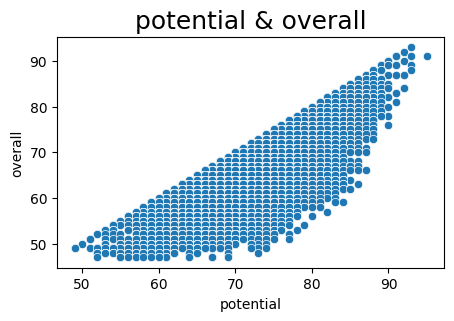

In [14]:
plt.figure(figsize=(5, 3))
ax = sns.scatterplot(x =df['potential'], y = df['overall'])
plt.xlabel("potential") 
plt.ylabel("overall")
plt.title("potential & overall", fontsize = 18)
plt.show()

There is a positive correlation between overall and potential

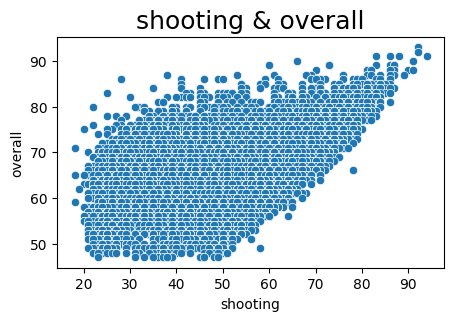

In [15]:
plt.figure(figsize=(5, 3))
ax = sns.scatterplot(x =df['shooting'], y = df['overall'])
plt.xlabel("shooting") 
plt.ylabel("overall")
plt.title("shooting & overall", fontsize = 18)
plt.show()

As players shooting skill, their FIFA Overall also increases in a higher slope.

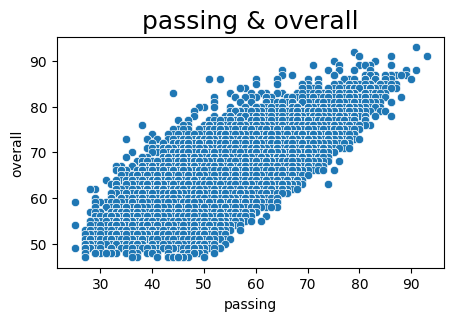

In [16]:
plt.figure(figsize=(5, 3))
ax = sns.scatterplot(x =df['passing'], y = df['overall'])
plt.xlabel("passing") 
plt.ylabel("overall")
plt.title("passing & overall", fontsize = 18)
plt.show()

As players passing skill, their FIFA Overall also increases in a higher slope.

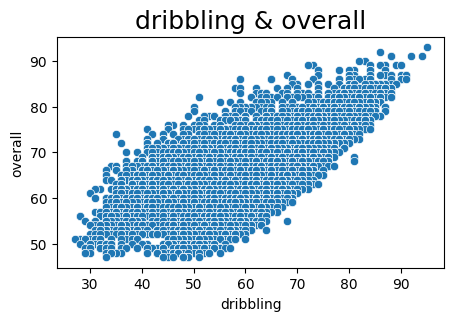

In [17]:
plt.figure(figsize=(5, 3))
ax = sns.scatterplot(x =df['dribbling'], y = df['overall'])
plt.xlabel("dribbling") 
plt.ylabel("overall")
plt.title("dribbling & overall", fontsize = 18)
plt.show()

As players dribbling skill, their FIFA Overall also increases in a higher slope.

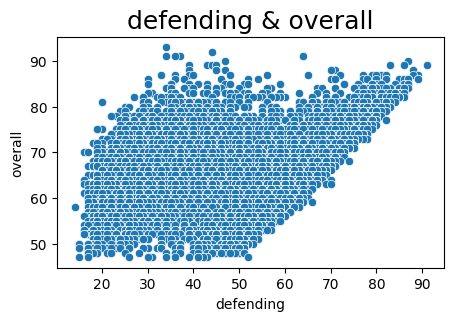

In [18]:
plt.figure(figsize=(5, 3))
ax = sns.scatterplot(x =df['defending'], y = df['overall'])
plt.xlabel("defending") 
plt.ylabel("overall")
plt.title("defending & overall", fontsize = 18)
plt.show()

As players defending skill, their FIFA Overall also increases in a higher slope.

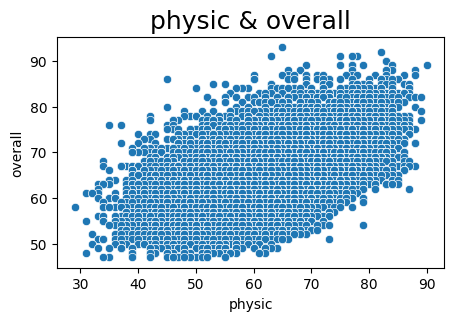

In [19]:
plt.figure(figsize=(5, 3))
ax = sns.scatterplot(x =df['physic'], y = df['overall'])
plt.xlabel("physic") 
plt.ylabel("overall")
plt.title("physic & overall", fontsize = 18)
plt.show()

As players physic is more, their FIFA Overall also increases in a higher slope.

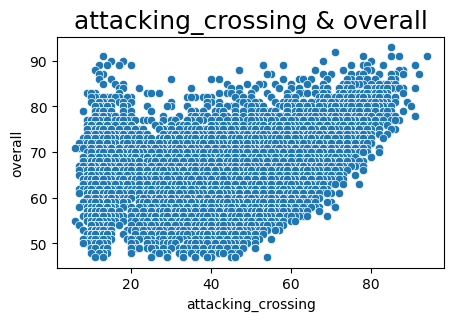

In [20]:
plt.figure(figsize=(5, 3))
ax = sns.scatterplot(x =df['attacking_crossing'], y = df['overall'])
plt.xlabel("attacking_crossing") 
plt.ylabel("overall")
plt.title("attacking_crossing & overall", fontsize = 18)
plt.show()

As players attacking_crossing , their FIFA Overall also increases in a higher slope.

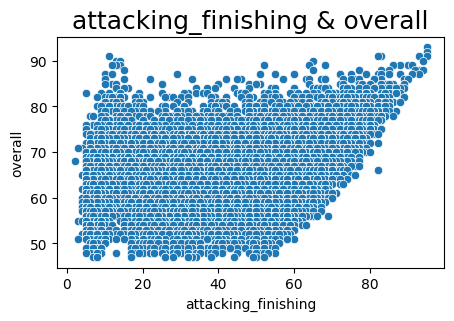

In [21]:
plt.figure(figsize=(5, 3))
ax = sns.scatterplot(x =df['attacking_finishing'], y = df['overall'])
plt.xlabel("attacking_finishing") 
plt.ylabel("overall")
plt.title("attacking_finishing & overall", fontsize = 18)
plt.show()

As players attacking finishing, their FIFA Overall also increases in a higher slope.

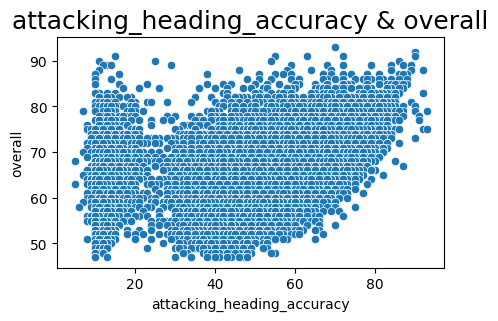

In [22]:
plt.figure(figsize=(5, 3))
ax = sns.scatterplot(x =df['attacking_heading_accuracy'], y = df['overall'])
plt.xlabel("attacking_heading_accuracy") 
plt.ylabel("overall")
plt.title("attacking_heading_accuracy & overall", fontsize = 18)
plt.show()

As players attacking_heading_accuracy, their FIFA Overall also increases in a higher slope.

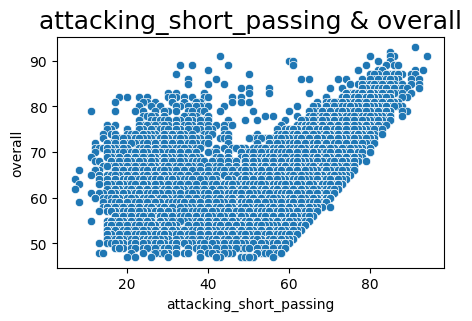

In [23]:
plt.figure(figsize=(5, 3))
ax = sns.scatterplot(x =df['attacking_short_passing'], y = df['overall'])
plt.xlabel("attacking_short_passing") 
plt.ylabel("overall")
plt.title("attacking_short_passing & overall", fontsize = 18)
plt.show()

As players attacking_short_passing, their FIFA Overall also increases in a higher slope.

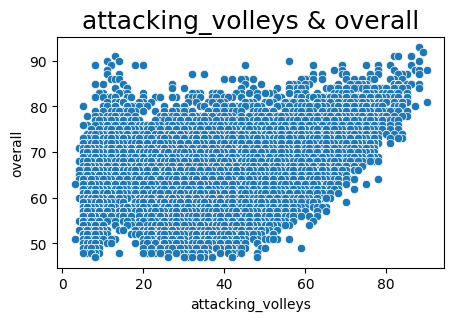

In [24]:
plt.figure(figsize=(5, 3))
ax = sns.scatterplot(x =df['attacking_volleys'], y = df['overall'])
plt.xlabel("attacking_volleys") 
plt.ylabel("overall")
plt.title("attacking_volleys & overall", fontsize = 18)
plt.show()

As players attacking_volleys, their FIFA Overall also increases in a higher slope.

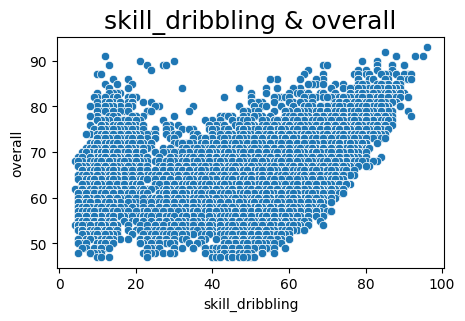

In [25]:
plt.figure(figsize=(5, 3))
ax = sns.scatterplot(x =df['skill_dribbling'], y = df['overall'])
plt.xlabel("skill_dribbling") 
plt.ylabel("overall")
plt.title("skill_dribbling & overall", fontsize = 18)
plt.show()

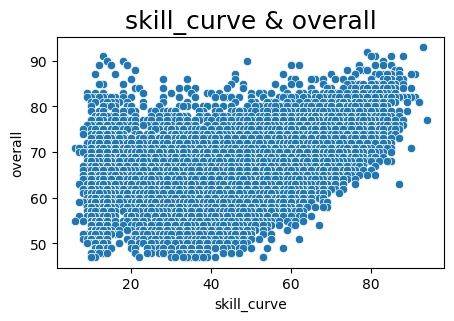

In [26]:
plt.figure(figsize=(5, 3))
ax = sns.scatterplot(x =df['skill_curve'], y = df['overall'])
plt.xlabel("skill_curve") 
plt.ylabel("overall")
plt.title("skill_curve & overall", fontsize = 18)
plt.show()

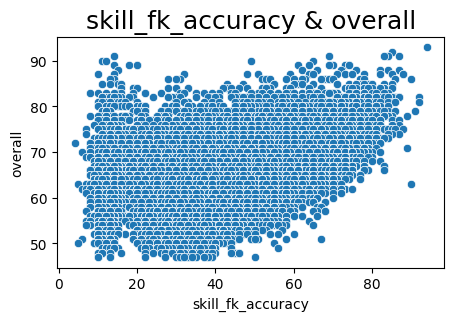

In [27]:
plt.figure(figsize=(5, 3))
ax = sns.scatterplot(x =df['skill_fk_accuracy'], y = df['overall'])
plt.xlabel("skill_fk_accuracy") 
plt.ylabel("overall")
plt.title("skill_fk_accuracy & overall", fontsize = 18)
plt.show()

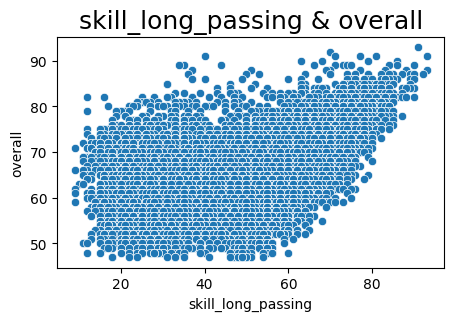

In [28]:
plt.figure(figsize=(5, 3))
ax = sns.scatterplot(x =df['skill_long_passing'], y = df['overall'])
plt.xlabel("skill_long_passing") 
plt.ylabel("overall")
plt.title("skill_long_passing & overall", fontsize = 18)
plt.show()

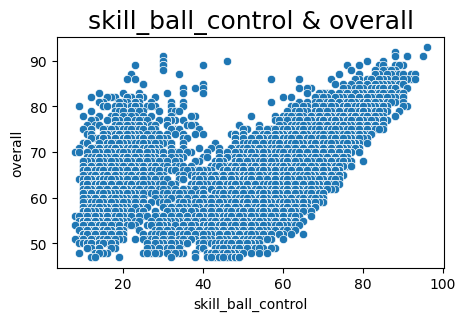

In [29]:
plt.figure(figsize=(5, 3))
ax = sns.scatterplot(x =df['skill_ball_control'], y = df['overall'])
plt.xlabel("skill_ball_control") 
plt.ylabel("overall")
plt.title("skill_ball_control & overall", fontsize = 18)
plt.show()

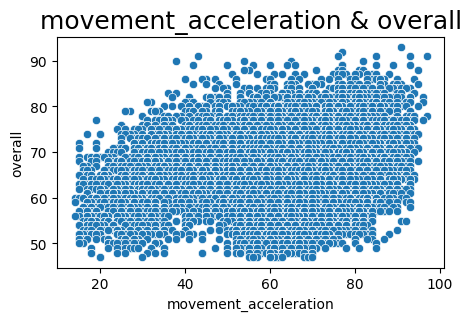

In [30]:
plt.figure(figsize=(5, 3))
ax = sns.scatterplot(x =df['movement_acceleration'], y = df['overall'])
plt.xlabel("movement_acceleration") 
plt.ylabel("overall")
plt.title("movement_acceleration & overall", fontsize = 18)
plt.show()

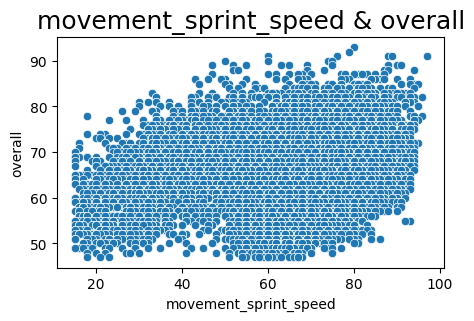

In [31]:
plt.figure(figsize=(5, 3))
ax = sns.scatterplot(x =df['movement_sprint_speed'], y = df['overall'])
plt.xlabel("movement_sprint_speed") 
plt.ylabel("overall")
plt.title("movement_sprint_speed & overall", fontsize = 18)
plt.show()

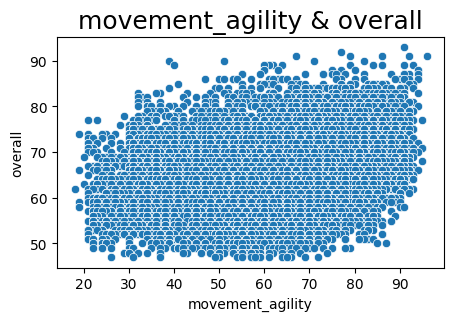

In [32]:
plt.figure(figsize=(5, 3))
ax = sns.scatterplot(x =df['movement_agility'], y = df['overall'])
plt.xlabel("movement_agility") 
plt.ylabel("overall")
plt.title("movement_agility & overall", fontsize = 18)
plt.show()

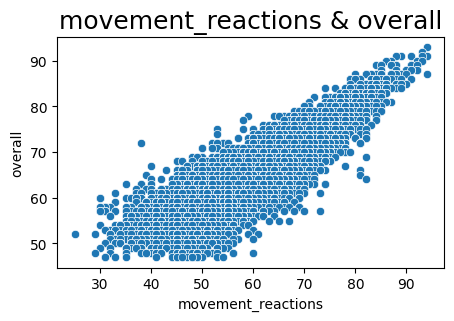

In [33]:
plt.figure(figsize=(5, 3))
ax = sns.scatterplot(x =df['movement_reactions'], y = df['overall'])
plt.xlabel("movement_reactions") 
plt.ylabel("overall")
plt.title("movement_reactions & overall", fontsize = 18)
plt.show()

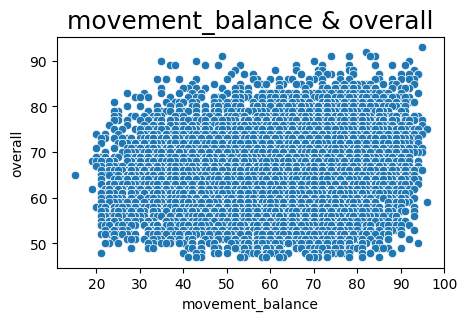

In [34]:
plt.figure(figsize=(5, 3))
ax = sns.scatterplot(x =df['movement_balance'], y = df['overall'])
plt.xlabel("movement_balance") 
plt.ylabel("overall")
plt.title("movement_balance & overall", fontsize = 18)
plt.show()

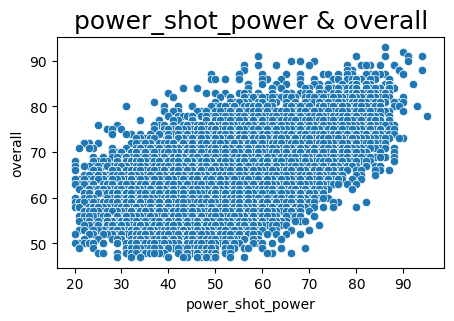

In [35]:
plt.figure(figsize=(5, 3))
ax = sns.scatterplot(x =df['power_shot_power'], y = df['overall'])
plt.xlabel("power_shot_power") 
plt.ylabel("overall")
plt.title("power_shot_power & overall", fontsize = 18)
plt.show()

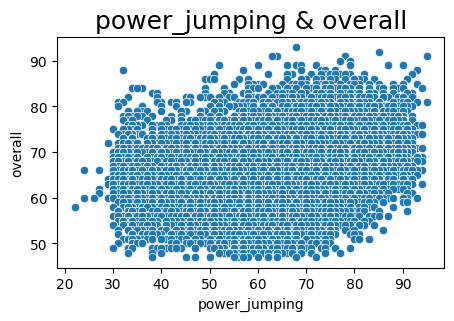

In [36]:
plt.figure(figsize=(5, 3))
ax = sns.scatterplot(x =df['power_jumping'], y = df['overall'])
plt.xlabel("power_jumping") 
plt.ylabel("overall")
plt.title("power_jumping & overall", fontsize = 18)
plt.show()

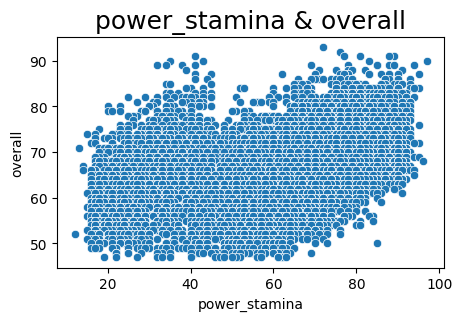

In [37]:
plt.figure(figsize=(5, 3))
ax = sns.scatterplot(x =df['power_stamina'], y = df['overall'])
plt.xlabel("power_stamina") 
plt.ylabel("overall")
plt.title("power_stamina & overall", fontsize = 18)
plt.show()

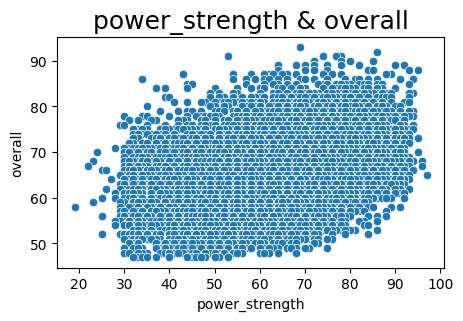

In [38]:
plt.figure(figsize=(5, 3))
ax = sns.scatterplot(x =df['power_strength'], y = df['overall'])
plt.xlabel("power_strength") 
plt.ylabel("overall")
plt.title("power_strength & overall", fontsize = 18)
plt.show()

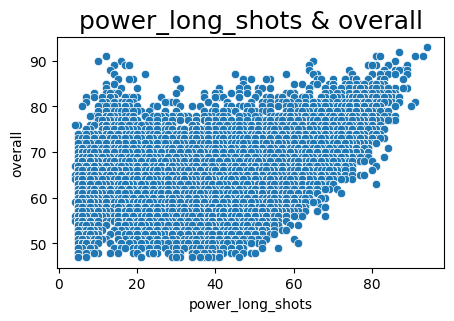

In [39]:
plt.figure(figsize=(5, 3))
ax = sns.scatterplot(x =df['power_long_shots'], y = df['overall'])
plt.xlabel("power_long_shots") 
plt.ylabel("overall")
plt.title("power_long_shots & overall", fontsize = 18)
plt.show()

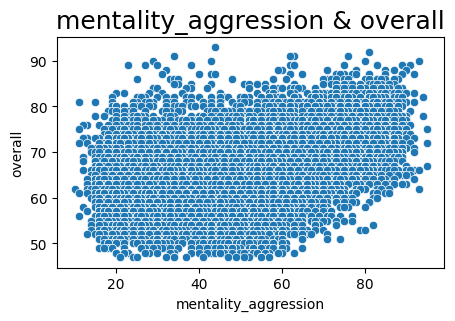

In [40]:
plt.figure(figsize=(5, 3))
ax = sns.scatterplot(x =df['mentality_aggression'], y = df['overall'])
plt.xlabel("mentality_aggression") 
plt.ylabel("overall")
plt.title("mentality_aggression & overall", fontsize = 18)
plt.show()

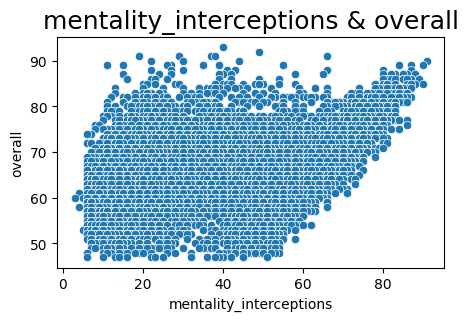

In [41]:
plt.figure(figsize=(5, 3))
ax = sns.scatterplot(x =df['mentality_interceptions'], y = df['overall'])
plt.xlabel("mentality_interceptions") 
plt.ylabel("overall")
plt.title("mentality_interceptions & overall", fontsize = 18)
plt.show()

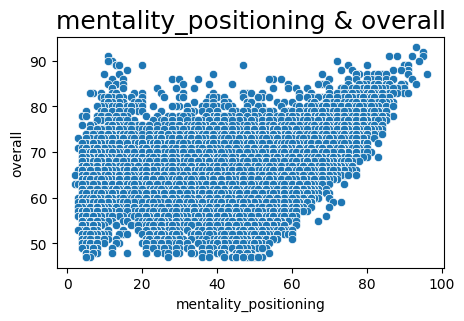

In [42]:
plt.figure(figsize=(5, 3))
ax = sns.scatterplot(x =df['mentality_positioning'], y = df['overall'])
plt.xlabel("mentality_positioning") 
plt.ylabel("overall")
plt.title("mentality_positioning & overall", fontsize = 18)
plt.show()

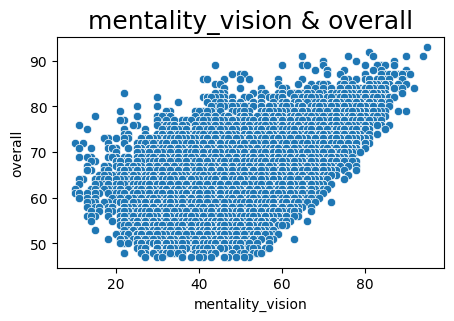

In [43]:
plt.figure(figsize=(5, 3))
ax = sns.scatterplot(x =df['mentality_vision'], y = df['overall'])
plt.xlabel("mentality_vision") 
plt.ylabel("overall")
plt.title("mentality_vision & overall", fontsize = 18)
plt.show()

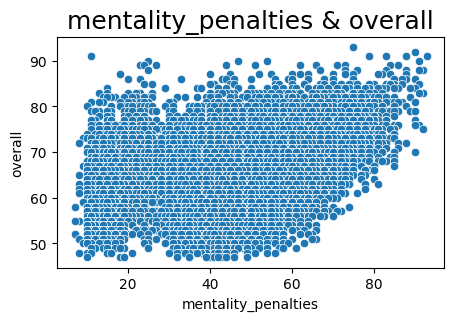

In [44]:
plt.figure(figsize=(5, 3))
ax = sns.scatterplot(x =df['mentality_penalties'], y = df['overall'])
plt.xlabel("mentality_penalties") 
plt.ylabel("overall")
plt.title("mentality_penalties & overall", fontsize = 18)
plt.show()

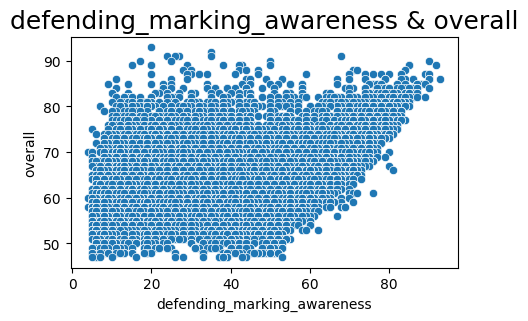

In [45]:
plt.figure(figsize=(5, 3))
ax = sns.scatterplot(x =df['defending_marking_awareness'], y = df['overall'])
plt.xlabel("defending_marking_awareness") 
plt.ylabel("overall")
plt.title("defending_marking_awareness & overall", fontsize = 18)
plt.show()

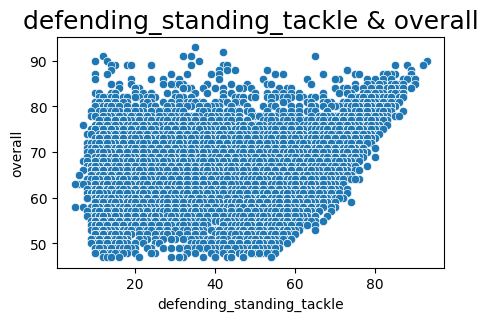

In [46]:
plt.figure(figsize=(5, 3))
ax = sns.scatterplot(x =df['defending_standing_tackle'], y = df['overall'])
plt.xlabel("defending_standing_tackle") 
plt.ylabel("overall")
plt.title("defending_standing_tackle & overall", fontsize = 18)
plt.show()

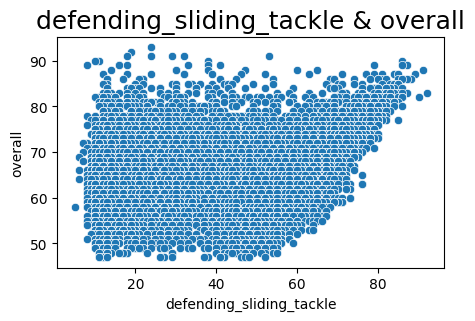

In [47]:
plt.figure(figsize=(5, 3))
ax = sns.scatterplot(x =df['defending_sliding_tackle'], y = df['overall'])
plt.xlabel("defending_sliding_tackle") 
plt.ylabel("overall")
plt.title("defending_sliding_tackle & overall", fontsize = 18)
plt.show()

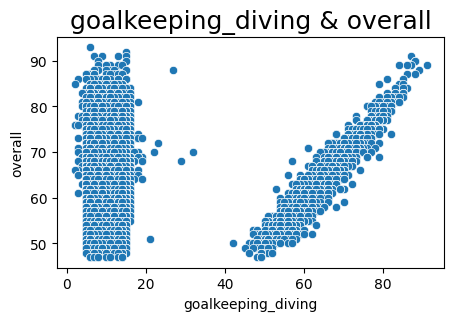

In [48]:
plt.figure(figsize=(5, 3))
ax = sns.scatterplot(x =df['goalkeeping_diving'], y = df['overall'])
plt.xlabel("goalkeeping_diving") 
plt.ylabel("overall")
plt.title("goalkeeping_diving & overall", fontsize = 18)
plt.show()

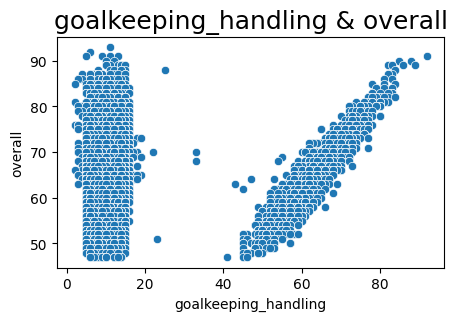

In [49]:
plt.figure(figsize=(5, 3))
ax = sns.scatterplot(x =df['goalkeeping_handling'], y = df['overall'])
plt.xlabel("goalkeeping_handling") 
plt.ylabel("overall")
plt.title("goalkeeping_handling & overall", fontsize = 18)
plt.show()

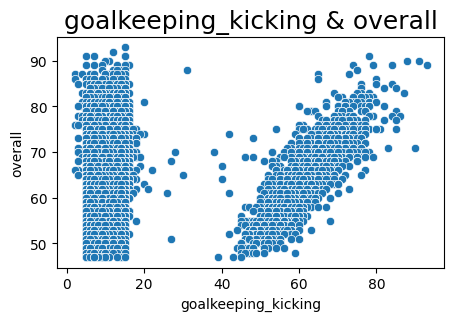

In [50]:
plt.figure(figsize=(5, 3))
ax = sns.scatterplot(x =df['goalkeeping_kicking'], y = df['overall'])
plt.xlabel("goalkeeping_kicking") 
plt.ylabel("overall")
plt.title("goalkeeping_kicking & overall", fontsize = 18)
plt.show()

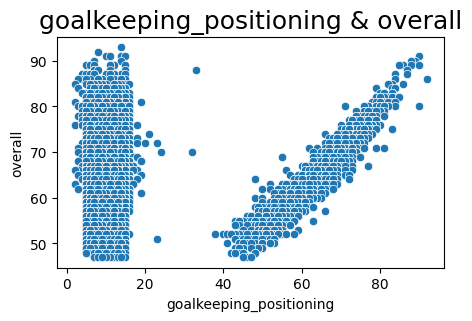

In [51]:
plt.figure(figsize=(5, 3))
ax = sns.scatterplot(x =df['goalkeeping_positioning'], y = df['overall'])
plt.xlabel("goalkeeping_positioning") 
plt.ylabel("overall")
plt.title("goalkeeping_positioning & overall", fontsize = 18)
plt.show()

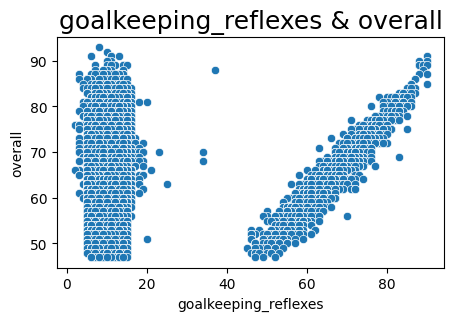

In [52]:
plt.figure(figsize=(5, 3))
ax = sns.scatterplot(x =df['goalkeeping_reflexes'], y = df['overall'])
plt.xlabel("goalkeeping_reflexes") 
plt.ylabel("overall")
plt.title("goalkeeping_reflexes & overall", fontsize = 18)
plt.show()

In [53]:
c1 = columns[19:29]
c1

Index(['pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic',
       'attacking_crossing', 'attacking_finishing',
       'attacking_heading_accuracy', 'attacking_short_passing'],
      dtype='object')

In [54]:
x = df[c1]
x

,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing
0,85.0,92.0,91.0,95.0,34.0,65.0,85,95,70,91
1,78.0,92.0,79.0,86.0,44.0,82.0,71,95,90,85
2,87.0,94.0,80.0,88.0,34.0,75.0,87,95,90,80
3,91.0,83.0,86.0,94.0,37.0,63.0,85,83,63,86
4,76.0,86.0,93.0,88.0,64.0,78.0,94,82,55,94
...,...,...,...,...,...,...,...,...,...,...
19234,58.0,35.0,46.0,48.0,42.0,49.0,46,32,48,50
19235,59.0,39.0,50.0,46.0,41.0,51.0,54,33,46,51
19236,60.0,37.0,45.0,49.0,41.0,52.0,39,32,43,49
19237,68.0,46.0,36.0,48.0,15.0,42.0,29,49,40,38


(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(0, 0, 'England'),
  Text(1, 0, 'Germany'),
  Text(2, 0, 'Spain'),
  Text(3, 0, 'France'),
  Text(4, 0, 'Argentina'),
  Text(5, 0, 'Brazil'),
  Text(6, 0, 'Japan'),
  Text(7, 0, 'Netherlands'),
  Text(8, 0, 'United States'),
  Text(9, 0, 'Poland')])

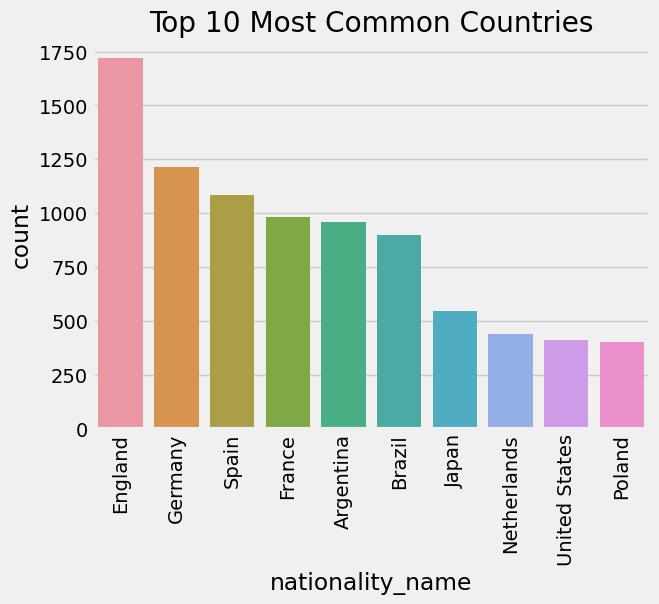

In [55]:
plt.style.use('fivethirtyeight')
ax = sns.countplot(x='nationality_name', data = df, order = df.nationality_name.value_counts().iloc[:10].index).set_title('Top 10 Most Common Countries')
plt.xticks(rotation='vertical')

Most of the players are from the country England.

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(0, 0, 'USA Major League Soccer'),
  Text(1, 0, 'Argentina Primera División'),
  Text(2, 0, 'English League Championship'),
  Text(3, 0, 'English Premier League'),
  Text(4, 0, 'Spain Primera Division'),
  Text(5, 0, 'English League One'),
  Text(6, 0, 'Spanish Segunda División'),
  Text(7, 0, 'English League Two'),
  Text(8, 0, 'Japanese J. League Division 1'),
  Text(9, 0, 'French Ligue 1')])

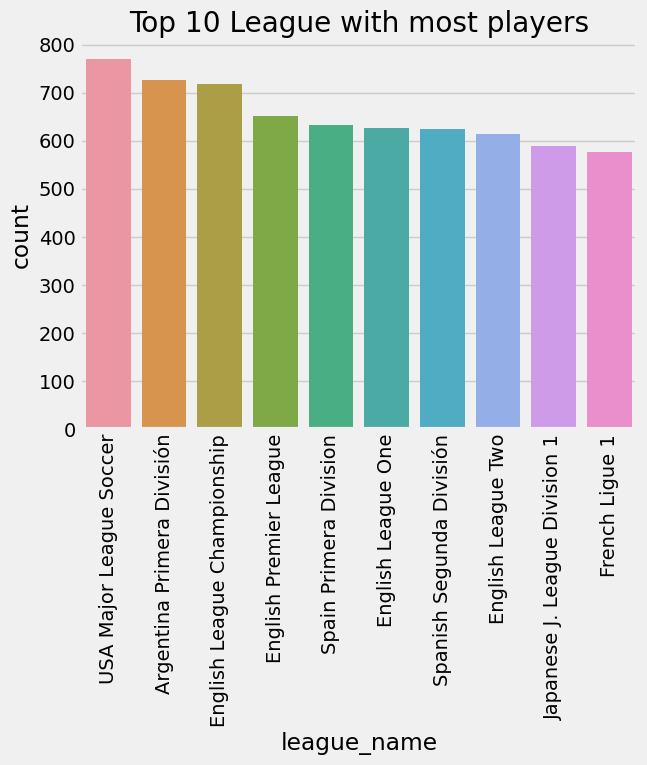

In [56]:
plt.style.use('fivethirtyeight')
ax = sns.countplot(x='league_name', data = df, order = df.league_name.value_counts().iloc[:10].index).set_title('Top 10 League with most players')
plt.xticks(rotation='vertical')

USA Major League Soccer has the most number of players playing.

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28]),
 [Text(0, 0, 'SUB'),
  Text(1, 0, 'RES'),
  Text(2, 0, 'RCB'),
  Text(3, 0, 'GK'),
  Text(4, 0, 'LCB'),
  Text(5, 0, 'RB'),
  Text(6, 0, 'LB'),
  Text(7, 0, 'ST'),
  Text(8, 0, 'RCM'),
  Text(9, 0, 'LCM'),
  Text(10, 0, 'LM'),
  Text(11, 0, 'RM'),
  Text(12, 0, 'CAM'),
  Text(13, 0, 'LDM'),
  Text(14, 0, 'RDM'),
  Text(15, 0, 'LS'),
  Text(16, 0, 'RS'),
  Text(17, 0, 'CB'),
  Text(18, 0, 'RW'),
  Text(19, 0, 'LW'),
  Text(20, 0, 'CDM'),
  Text(21, 0, 'RWB'),
  Text(22, 0, 'LWB'),
  Text(23, 0, 'CM'),
  Text(24, 0, 'RF'),
  Text(25, 0, 'LF'),
  Text(26, 0, 'LAM'),
  Text(27, 0, 'RAM'),
  Text(28, 0, 'CF')])

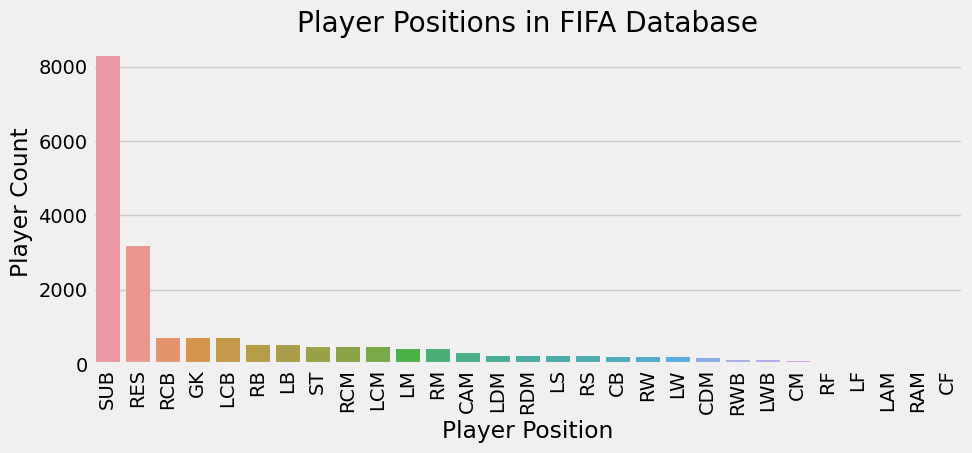

In [57]:
plt.figure(figsize=(10,4))
ax = sns.countplot(x='club_position', data = df, order = df['club_position'].value_counts().index)
ax.set_xlabel(xlabel = 'Player Position')
ax.set_ylabel(ylabel = 'Player Count')
ax.set_title(label = 'Player Positions in FIFA Database')
plt.xticks(rotation='vertical')

Most of the players are kept as substitutes.

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]),
 [Text(0, 0, '155'),
  Text(1, 0, '156'),
  Text(2, 0, '158'),
  Text(3, 0, '159'),
  Text(4, 0, '160'),
  Text(5, 0, '161'),
  Text(6, 0, '162'),
  Text(7, 0, '163'),
  Text(8, 0, '164'),
  Text(9, 0, '165'),
  Text(10, 0, '166'),
  Text(11, 0, '167'),
  Text(12, 0, '168'),
  Text(13, 0, '169'),
  Text(14, 0, '170'),
  Text(15, 0, '171'),
  Text(16, 0, '172'),
  Text(17, 0, '173'),
  Text(18, 0, '174'),
  Text(19, 0, '175'),
  Text(20, 0, '176'),
  Text(21, 0, '177'),
  Text(22, 0, '178'),
  Text(23, 0, '179'),
  Text(24, 0, '180'),
  Text(25, 0, '181'),
  Text(26, 0, '182'),
  Text(27, 0, '183'),
  Text(28, 0, '184'),
  Text(29, 0, '185'),
  Text(30, 0, '186'),
  Text(31, 0, '187'),
  Text(32, 0, '188'),
  Text(33, 0, '189'),
  Text(34, 0, '190'),
  Text(35, 0, '191

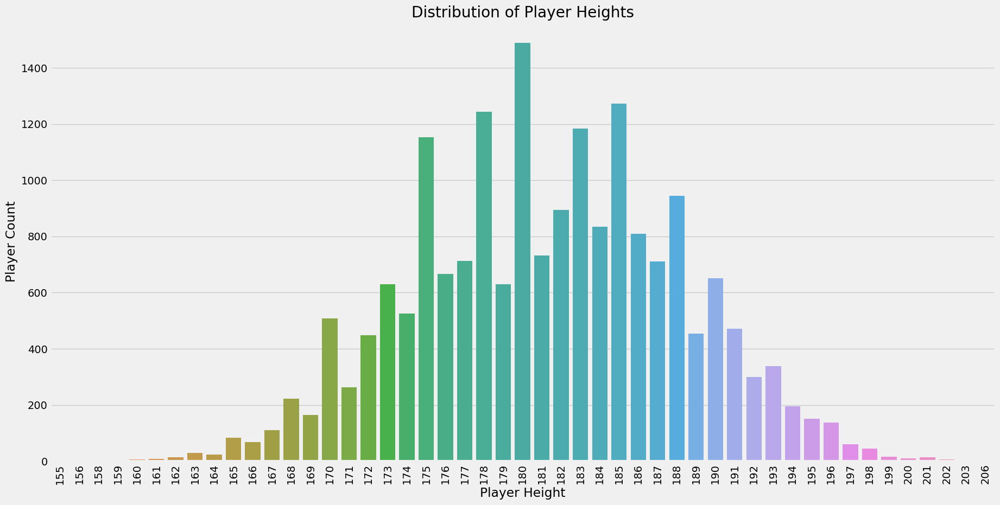

In [58]:
plt.figure(figsize = (20,10))
ax = sns.countplot(x = 'height_cm', data = df)
ax.set_title(label = 'Distribution of Player Heights')
ax.set_xlabel(xlabel = 'Player Height')
ax.set_ylabel(ylabel = 'Player Count')
plt.xticks(rotation='vertical')

The unnatural distribution (especially at 180) indicates that some rounding has occured.

In [59]:
#Tallest Player
print("Tallest Players: ")
df.loc[df['height_cm'] == df['height_cm'].max()]

Tallest Players: 


,sofifa_id,player_url,short_name,long_name,player_positions,overall,potential,value_eur,wage_eur,age,...,lcb,cb,rcb,rb,gk,player_face_url,club_logo_url,club_flag_url,nation_logo_url,nation_flag_url
9929,199321,https://sofifa.com/player/199321/tomas-holy/22...,T. Holý,Tomáš Holý,GK,65,66,550000.0,3000.0,29,...,29,29,29,25,66,https://cdn.sofifa.net/players/199/321/22_120.png,https://cdn.sofifa.net/teams/94/60.png,https://cdn.sofifa.net/flags/gb-eng.png,NaN,https://cdn.sofifa.net/flags/cz.png


In [60]:
#Shortest Player
print("Shortest Player: ")
df.loc[df['height_cm'] == df['height_cm'].min()]

Shortest Player: 


,sofifa_id,player_url,short_name,long_name,player_positions,overall,potential,value_eur,wage_eur,age,...,lcb,cb,rcb,rb,gk,player_face_url,club_logo_url,club_flag_url,nation_logo_url,nation_flag_url
15581,255092,https://sofifa.com/player/255092/marco-garcia/...,M. García,Marco Antonio García Robledo,CM,60,72,600000.0,2000.0,21,...,52,52,52,55,15,https://cdn.sofifa.net/players/255/092/22_120.png,https://cdn.sofifa.net/teams/1881/60.png,https://cdn.sofifa.net/flags/mx.png,NaN,https://cdn.sofifa.net/flags/mx.png


In [61]:
#skewness
df['height_cm'].skew()

-0.0399051653370662

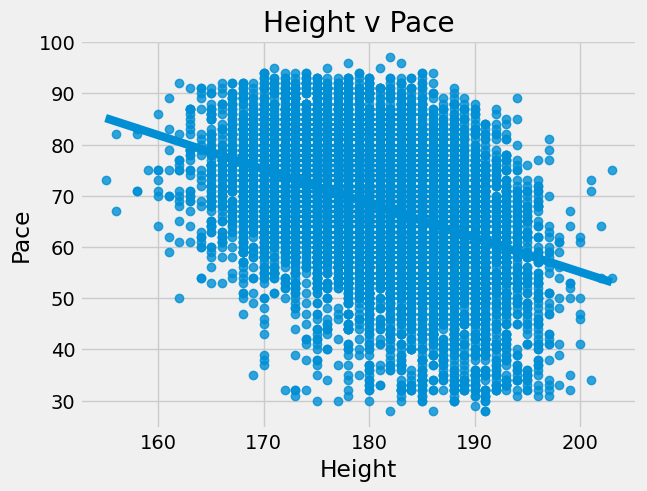

In [62]:
plt.figure()
x=df.head(20)['height_cm']
y=df.head(20)['pace']

ax = sns.regplot(x='height_cm',y='pace', data=df)
plt.title('Height v Pace')
plt.xlabel('Height')
plt.ylabel('Pace')
plt.show()

Pace tends to decrease with increase in height.

Text(0, 0.5, 'Player Count')

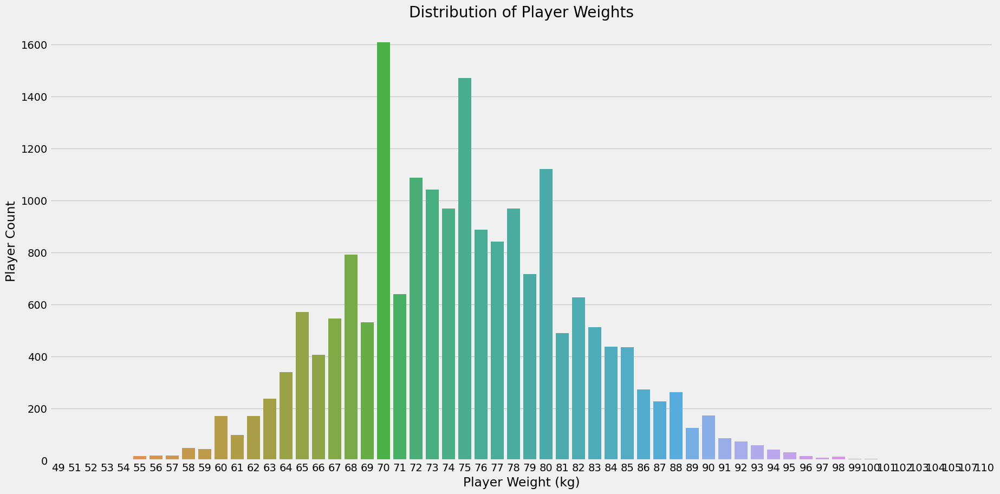

In [63]:
plt.figure(figsize = (20,10))
ax = sns.countplot(x = 'weight_kg', data = df)
ax.set_title(label = 'Distribution of Player Weights')
ax.set_xlabel(xlabel = 'Player Weight (kg)')
ax.set_ylabel(ylabel = 'Player Count')

This unnatural distribution (especially at 70 to 80) indicates that some rounding has occurred.

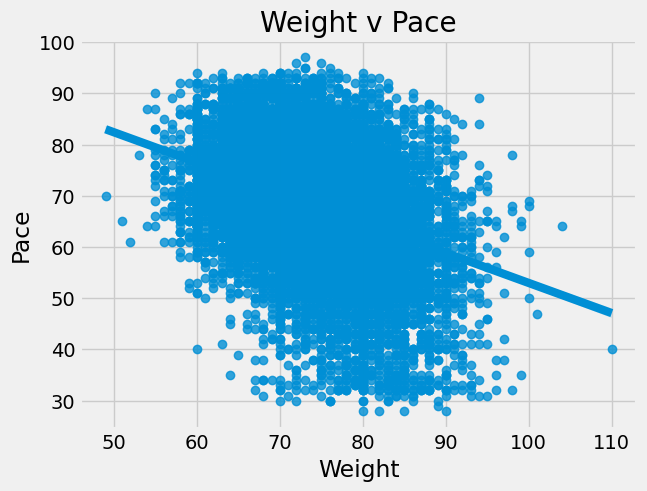

In [64]:
plt.figure()
x=df.head(20)['weight_kg']
y=df.head(20)['pace']

ax = sns.regplot(x='weight_kg',y='pace', data=df)

plt.title('Weight v Pace')
plt.xlabel('Weight')
plt.ylabel('Pace')
plt.show()

Pace tends to decrease with increase in weight.

Text(0, 0.5, 'Player Count')

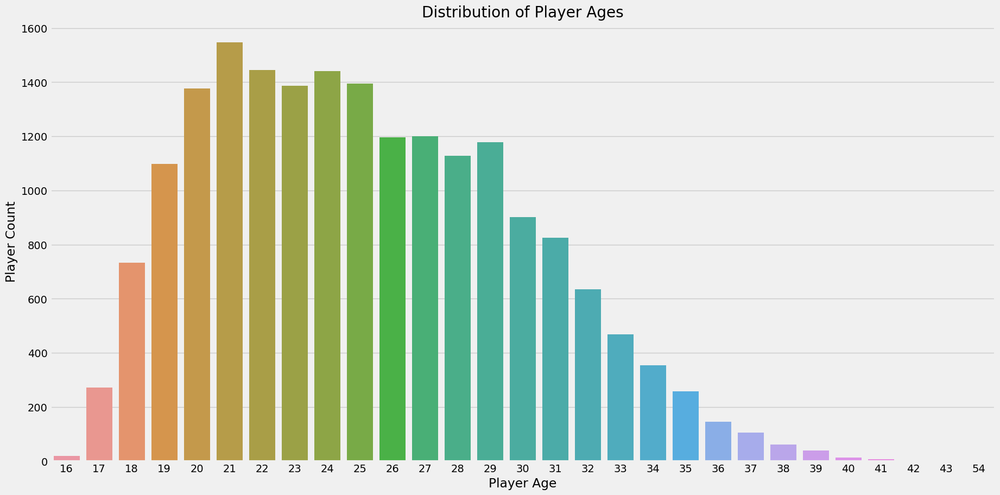

In [65]:
plt.figure(figsize = (20,10))
ax = sns.countplot(x = 'age', data = df)
ax.set_title(label = 'Distribution of Player Ages')
ax.set_xlabel(xlabel = 'Player Age')
ax.set_ylabel(ylabel = 'Player Count')

Common age is in the range 20 to 29.

In [66]:
#Oldest Player
print("Oldest Players: ")
df.loc[df['age'] == df['age'].max()]

Oldest Players: 


,sofifa_id,player_url,short_name,long_name,player_positions,overall,potential,value_eur,wage_eur,age,...,lcb,cb,rcb,rb,gk,player_face_url,club_logo_url,club_flag_url,nation_logo_url,nation_flag_url
16209,254704,https://sofifa.com/player/254704/kazuyoshi-miu...,K. Miura,三浦 知良,ST,59,59,NaN,700.0,54,...,34,34,34,33,14,https://cdn.sofifa.net/players/254/704/22_120.png,https://cdn.sofifa.net/teams/113197/60.png,https://cdn.sofifa.net/flags/jp.png,NaN,https://cdn.sofifa.net/flags/jp.png


In [67]:
#Youngest Player
print("Youngest Players: ")
df.loc[df['age'] == df['age'].min()]

Youngest Players: 


,sofifa_id,player_url,short_name,long_name,player_positions,overall,potential,value_eur,wage_eur,age,...,lcb,cb,rcb,rb,gk,player_face_url,club_logo_url,club_flag_url,nation_logo_url,nation_flag_url
9800,264240,https://sofifa.com/player/264240/pablo-martin-...,Gavi,Pablo Martín Páez Gavira,CM,66,85,2100000.0,4000.0,16,...,54,54,54,59,18,https://cdn.sofifa.net/players/264/240/22_120.png,https://cdn.sofifa.net/teams/241/60.png,https://cdn.sofifa.net/flags/es.png,NaN,https://cdn.sofifa.net/flags/es.png
13331,263370,https://sofifa.com/player/263370/valentin-barc...,V. Barco,Valentín Barco,LB,63,83,1300000.0,500.0,16,...,59,59,59,63,17,https://cdn.sofifa.net/players/263/370/22_120.png,https://cdn.sofifa.net/teams/1877/60.png,https://cdn.sofifa.net/flags/ar.png,NaN,https://cdn.sofifa.net/flags/ar.png
14281,262109,https://sofifa.com/player/262109/alexios-kalog...,A. Kalogeropoulos,Alexios Kalogeropoulos,CB,62,82,1000000.0,500.0,16,...,64,64,64,62,17,https://cdn.sofifa.net/players/262/109/22_120.png,https://cdn.sofifa.net/teams/280/60.png,https://cdn.sofifa.net/flags/gr.png,NaN,https://cdn.sofifa.net/flags/gr.png
15929,264179,https://sofifa.com/player/264179/pelayo-gonzal...,Yayo,Pelayo González Rey,CM,60,78,600000.0,500.0,16,...,58,58,58,59,18,https://cdn.sofifa.net/players/264/179/22_120.png,https://cdn.sofifa.net/teams/110827/60.png,https://cdn.sofifa.net/flags/es.png,NaN,https://cdn.sofifa.net/flags/es.png
16303,259442,https://sofifa.com/player/259442/rav-van-den-b...,R. van den Berg,Rav van den Berg,CB,59,83,675000.0,500.0,16,...,61,61,61,55,16,https://cdn.sofifa.net/players/259/442/22_120.png,https://cdn.sofifa.net/teams/1914/60.png,https://cdn.sofifa.net/flags/nl.png,NaN,https://cdn.sofifa.net/flags/nl.png
16916,263147,https://sofifa.com/player/263147/alexandru-mus...,A. Musi,Alexandru Musi,"LW, CAM",58,77,500000.0,600.0,16,...,38,38,38,46,18,https://cdn.sofifa.net/players/263/147/22_120.png,https://cdn.sofifa.net/teams/100761/60.png,https://cdn.sofifa.net/flags/ro.png,NaN,https://cdn.sofifa.net/flags/ro.png
16982,264421,https://sofifa.com/player/264421/thierry-small...,T. Small,Thierry Small,LB,58,77,475000.0,500.0,16,...,55,55,55,58,16,https://cdn.sofifa.net/players/264/421/22_120.png,https://cdn.sofifa.net/teams/17/60.png,https://cdn.sofifa.net/flags/gb-eng.png,NaN,https://cdn.sofifa.net/flags/gb-eng.png
17414,264180,https://sofifa.com/player/264180/alfie-devine/...,A. Devine,Alfie Devine,"CM, CDM",57,82,500000.0,1000.0,16,...,56,56,56,57,17,https://cdn.sofifa.net/players/264/180/22_120.png,https://cdn.sofifa.net/teams/18/60.png,https://cdn.sofifa.net/flags/gb-eng.png,NaN,https://cdn.sofifa.net/flags/gb-eng.png
17930,256353,https://sofifa.com/player/256353/zak-emmerson/...,Z. Emmerson,Zak Emmerson,"CF, ST",55,74,325000.0,2000.0,16,...,33,33,33,41,15,https://cdn.sofifa.net/players/256/353/22_120.png,https://cdn.sofifa.net/teams/1808/60.png,https://cdn.sofifa.net/flags/gb-eng.png,NaN,https://cdn.sofifa.net/flags/gb-eng.png
17946,257157,https://sofifa.com/player/257157/filip-bundgaa...,F. Bundgaard,Filip Bundgaard Kristensen,"RM, ST",55,75,350000.0,500.0,16,...,43,43,43,47,18,https://cdn.sofifa.net/players/257/157/22_120.png,https://cdn.sofifa.net/teams/1786/60.png,https://cdn.sofifa.net/flags/dk.png,NaN,https://cdn.sofifa.net/flags/dk.png


In [68]:
#Skewness
df['age'].skew()

0.43118348150697433

In [69]:
fig = go.Figure()

fig = go.Figure(data=go.Scatter(
    x = df['age'],
    y = df['overall'],
    mode='markers',
    marker=dict(
        color=df['overall'], 
        showscale=True
    ),
    text= df['short_name'],
))

fig.update_layout(title='Age vs Overall Rating',
                  xaxis_title='Age',
                  yaxis_title='Overall Rating')
fig.show()



    No definite pattern is visible since the plot is vastly spread.
    While age doesnt linearly effect rating, some trends can be observed.
    Minimum rating generally increases with age.
    Maximum of rating first increases and then decreases, with peak at 34 (Messi).


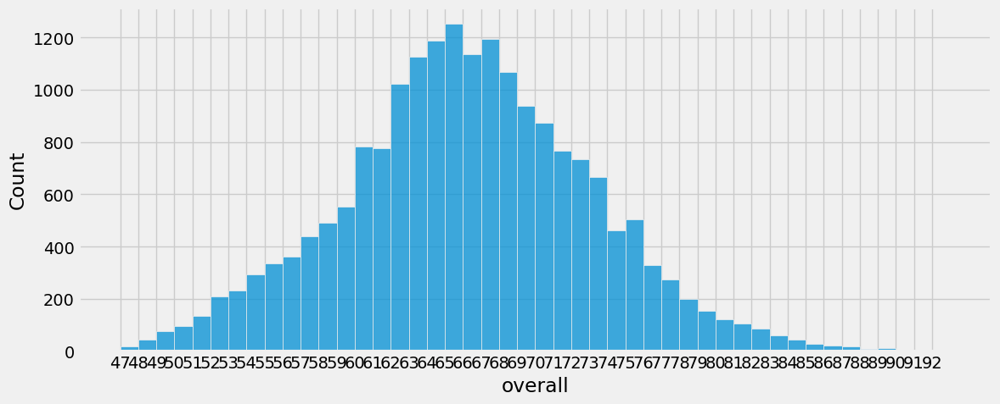

In [70]:
fig, ax = plt.subplots(figsize=(12, 5), tight_layout=True)

sns.histplot(df, x='overall', binwidth=1)

bins = np.arange(df['overall'].min(), df['overall'].max(), 1)
plt.xticks(bins)
plt.show()

It seems most players have a rating of 65 and 67.

<ipython-input-71-0d32bd3b1410>:1: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




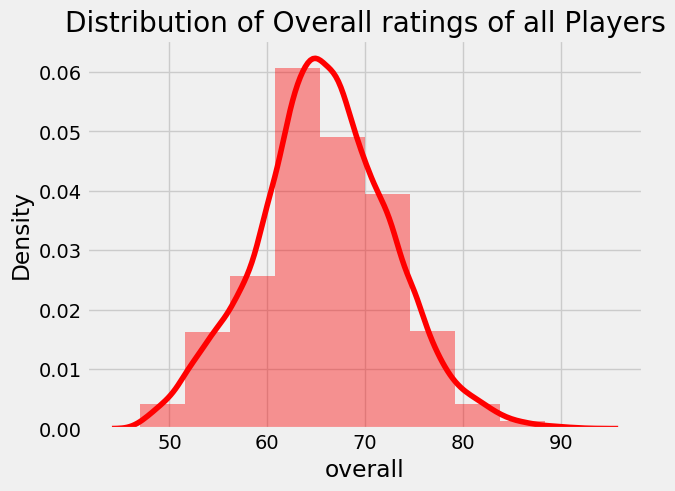

In [71]:
sns.distplot(df['overall'], bins=10, color='r')
plt.title("Distribution of Overall ratings of all Players")
plt.savefig("Distribution.png")
plt.show()

The overall rating of all players is a normal distribution.

In [72]:
top_15 = df.nlargest(15, 'overall')
top_15.head(5)

,sofifa_id,player_url,short_name,long_name,player_positions,overall,potential,value_eur,wage_eur,age,...,lcb,cb,rcb,rb,gk,player_face_url,club_logo_url,club_flag_url,nation_logo_url,nation_flag_url
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,"RW, ST, CF",93,93,78000000.0,320000.0,34,...,53,53,53,64,22,https://cdn.sofifa.net/players/158/023/22_120.png,https://cdn.sofifa.net/teams/73/60.png,https://cdn.sofifa.net/flags/fr.png,https://cdn.sofifa.net/teams/1369/60.png,https://cdn.sofifa.net/flags/ar.png
1,188545,https://sofifa.com/player/188545/robert-lewand...,R. Lewandowski,Robert Lewandowski,ST,92,92,119500000.0,270000.0,32,...,63,63,63,64,22,https://cdn.sofifa.net/players/188/545/22_120.png,https://cdn.sofifa.net/teams/21/60.png,https://cdn.sofifa.net/flags/de.png,https://cdn.sofifa.net/teams/1353/60.png,https://cdn.sofifa.net/flags/pl.png
2,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,"ST, LW",91,91,45000000.0,270000.0,36,...,56,56,56,63,23,https://cdn.sofifa.net/players/020/801/22_120.png,https://cdn.sofifa.net/teams/11/60.png,https://cdn.sofifa.net/flags/gb-eng.png,https://cdn.sofifa.net/teams/1354/60.png,https://cdn.sofifa.net/flags/pt.png
3,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Júnior,"LW, CAM",91,91,129000000.0,270000.0,29,...,53,53,53,65,23,https://cdn.sofifa.net/players/190/871/22_120.png,https://cdn.sofifa.net/teams/73/60.png,https://cdn.sofifa.net/flags/fr.png,NaN,https://cdn.sofifa.net/flags/br.png
4,192985,https://sofifa.com/player/192985/kevin-de-bruy...,K. De Bruyne,Kevin De Bruyne,"CM, CAM",91,91,125500000.0,350000.0,30,...,72,72,72,78,24,https://cdn.sofifa.net/players/192/985/22_120.png,https://cdn.sofifa.net/teams/10/60.png,https://cdn.sofifa.net/flags/gb-eng.png,https://cdn.sofifa.net/teams/1325/60.png,https://cdn.sofifa.net/flags/be.png


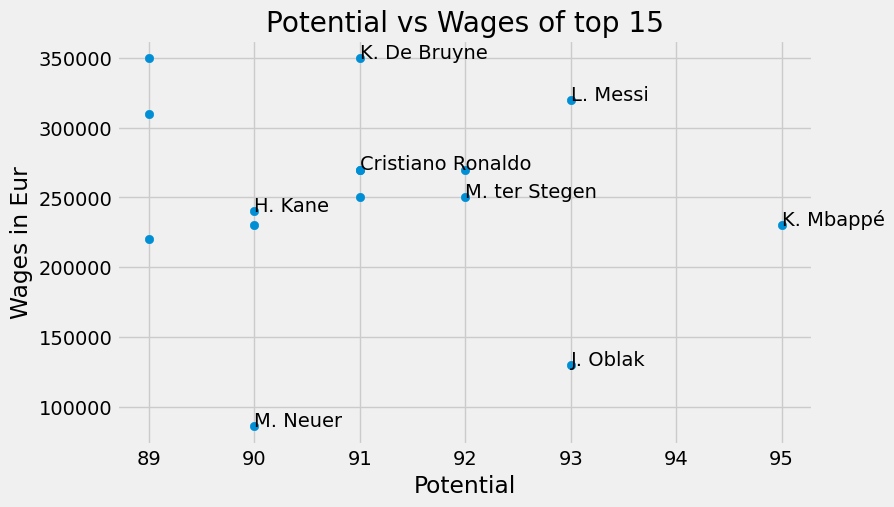

In [73]:
# Let's see if high overall score correlates with earnings, for the top 15 players

fig, ax = plt.subplots(figsize=(8,5))

plt.scatter(top_15['potential'], top_15['wage_eur'] )
plt.text(top_15.iloc[0]['potential'], top_15.iloc[0]['wage_eur'], top_15.iloc[0]['short_name'])
# plt.text(top_15.iloc[1]['potential'], top_15.iloc[1]['wage_eur'], top_15.iloc[1]['short_name']) for better view
plt.text(top_15.iloc[2]['potential'], top_15.iloc[2]['wage_eur'], top_15.iloc[2]['short_name'])
# plt.text(top_15.iloc[3]['potential'], top_15.iloc[3]['wage_eur'], top_15.iloc[3]['short_name'])
plt.text(top_15.iloc[4]['potential'], top_15.iloc[4]['wage_eur'], top_15.iloc[4]['short_name'])
plt.text(top_15.iloc[5]['potential'], top_15.iloc[5]['wage_eur'], top_15.iloc[5]['short_name'])
plt.text(top_15.iloc[6]['potential'], top_15.iloc[6]['wage_eur'], top_15.iloc[6]['short_name'])
plt.text(top_15.iloc[7]['potential'], top_15.iloc[7]['wage_eur'], top_15.iloc[7]['short_name'])
plt.text(top_15.iloc[8]['potential'], top_15.iloc[8]['wage_eur'], top_15.iloc[8]['short_name'])
plt.text(top_15.iloc[9]['potential'], top_15.iloc[9]['wage_eur'], top_15.iloc[9]['short_name'])

ax.set_title("Potential vs Wages of top 15")
ax.set_ylabel('Wages in Eur')
ax.set_xlabel('Potential')

plt.show()

Among the top 15 players, we see that there's no relationship between potential & wages.

In [74]:
# Quick calculation to separate players based on preferred foot

df.groupby(['preferred_foot']).count()[['sofifa_id']]

,sofifa_id
preferred_foot,
Left,4565
Right,14674


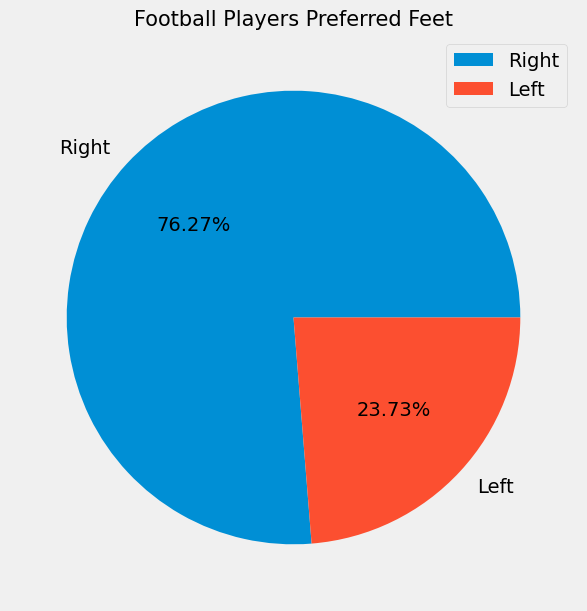

In [75]:
# Visualize with a pie, and include percentages using autopct

# Which foot does the footballers in fifa 21 use more?

preferred_foot_labels = df["preferred_foot"].value_counts().index # (Right,Left) 
preferred_foot_values = df["preferred_foot"].value_counts().values # (Right Values, Left Values)
explode = (0, 0.1) # used to separate the pie

# Visualize

plt.figure(figsize = (7,7))
plt.pie(preferred_foot_values, labels=preferred_foot_labels,autopct='%1.2f%%')
plt.title('Football Players Preferred Feet',color = 'black',fontsize = 15)
plt.legend()
plt.show()

Majority of football players are right footed.

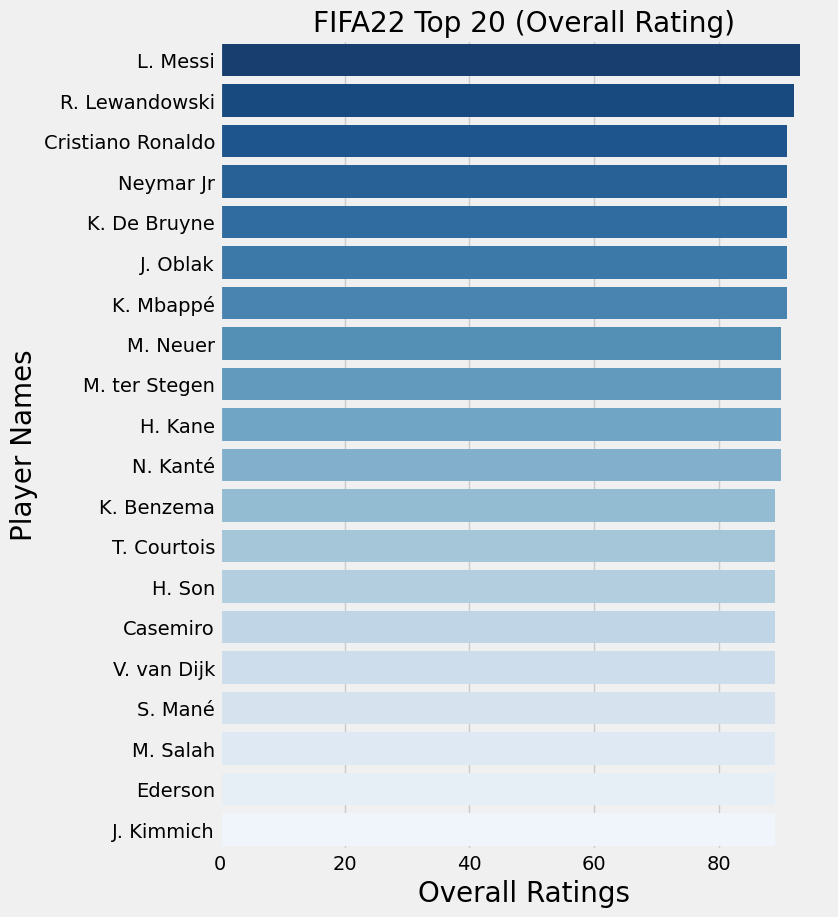

In [76]:
# Top 20 players overall

# We get the names and overals from the data
Overall = df["overall"]
footballer_name = df["short_name"]

# Let's create dataframe(Name,Overall)
data = pd.DataFrame({'short_name': footballer_name,'overall':Overall})

x = df['short_name'].head(20) 
y = df['overall'].head(20)

# plot
plt.figure(figsize=(7,10))


ax= sns.barplot(x=y, y=x, palette = 'Blues_r', orient='h')
plt.xticks()
plt.xlabel('Overall Ratings', size = 20) 
plt.ylabel('Player Names', size = 20 ) 
plt.title('FIFA22 Top 20 (Overall Rating)')

plt.show()

Messi is the best player.

In [77]:
#shooting
player_shooting=df[['short_name','shooting']]

In [78]:
player_shooting.sort_values(by=['shooting'],ascending=False).head()

,short_name,shooting
2,Cristiano Ronaldo,94.0
0,L. Messi,92.0
1,R. Lewandowski,92.0
29,E. Haaland,91.0
9,H. Kane,91.0


/usr/local/lib/python3.10/dist-packages/seaborn/algorithms.py:98: RuntimeWarning:

Mean of empty slice

/usr/local/lib/python3.10/dist-packages/seaborn/algorithms.py:98: RuntimeWarning:

Mean of empty slice

/usr/local/lib/python3.10/dist-packages/seaborn/algorithms.py:98: RuntimeWarning:

Mean of empty slice

/usr/local/lib/python3.10/dist-packages/seaborn/algorithms.py:98: RuntimeWarning:

Mean of empty slice



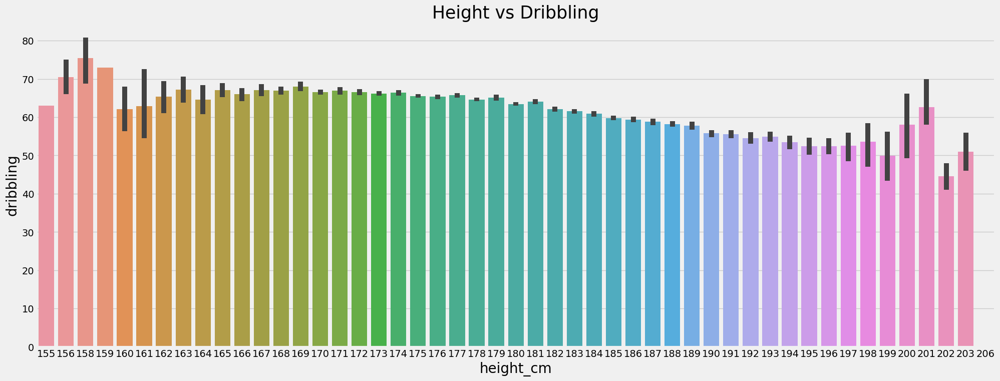

In [79]:
#Height vs Dribbling
plt.figure(figsize=(22,8))
plt.xlabel("Height",fontsize=20)
plt.ylabel("Dribbling",fontsize=20)
plt.title("Height vs Dribbling",fontsize=25)
sns.barplot(x='height_cm',y='dribbling',data=df.sort_values('height_cm',inplace=False))
plt.show()

Dribbling  tends to decrease with increase in height.

**Data Preprocessing**

In [80]:
#checking duplicate
duplicate = df[df.duplicated()]
duplicate.shape

(0, 110)

In [81]:
df = df.drop(['player_url','long_name','dob','club_team_id','club_name','league_name','league_level',
          'club_position','club_jersey_number','club_loaned_from',
          'club_joined','club_contract_valid_until','nationality_id',
          'nationality_name','nation_team_id','nation_position',
          'nation_jersey_number','preferred_foot','real_face','player_tags',
          'player_traits','player_face_url','club_logo_url','club_flag_url',
          'nation_logo_url','nation_flag_url'], axis=1)
df.head()

,sofifa_id,short_name,player_positions,overall,potential,value_eur,wage_eur,age,height_cm,weight_kg,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk
0,158023,L. Messi,"RW, ST, CF",93,93,78000000.0,320000.0,34,170,72,...,67,67,67,69,64,53,53,53,64,22
1,188545,R. Lewandowski,ST,92,92,119500000.0,270000.0,32,185,81,...,69,69,69,67,64,63,63,63,64,22
2,20801,Cristiano Ronaldo,"ST, LW",91,91,45000000.0,270000.0,36,187,83,...,62,62,62,66,63,56,56,56,63,23
3,190871,Neymar Jr,"LW, CAM",91,91,129000000.0,270000.0,29,175,68,...,66,66,66,70,65,53,53,53,65,23
4,192985,K. De Bruyne,"CM, CAM",91,91,125500000.0,350000.0,30,181,70,...,83,83,83,82,78,72,72,72,78,24


In [82]:
df.isnull().sum()

sofifa_id           0
short_name          0
player_positions    0
overall             0
potential           0
                   ..
lcb                 0
cb                  0
rcb                 0
rb                  0
gk                  0
Length: 84, dtype: int64

<ipython-input-83-a0cc071cb3b6>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




<Axes: xlabel='value_eur', ylabel='Density'>

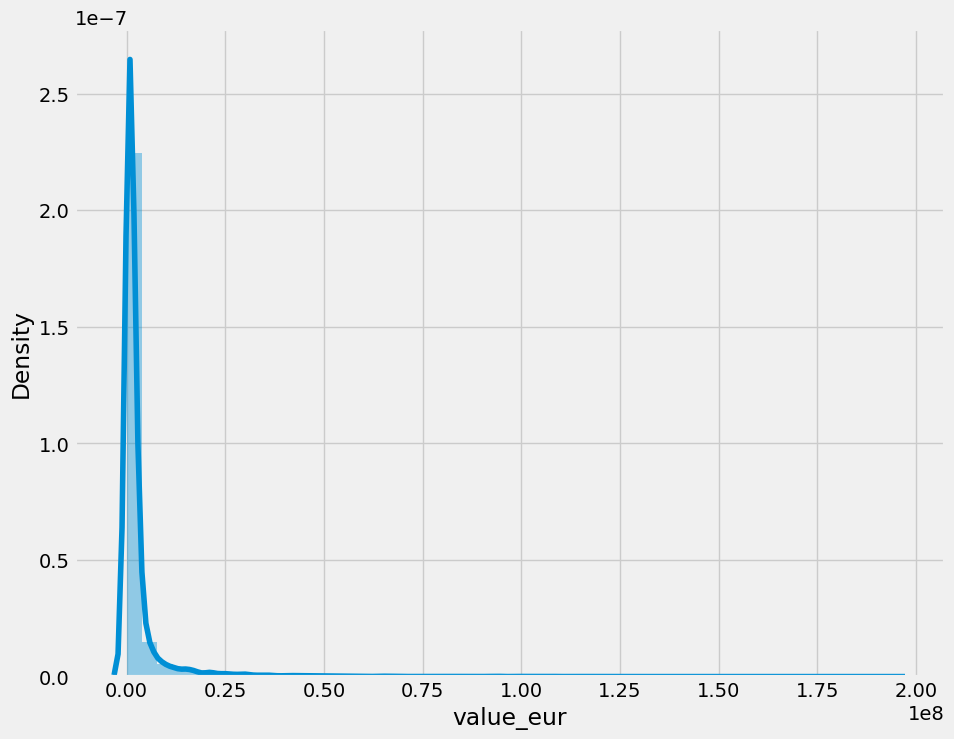

In [83]:
plt.subplots(figsize=(10,8))
sns.distplot(df.value_eur)

In [84]:
df["value_eur"].skew()

8.186343432357482

In [85]:
df['value_eur'] = df['value_eur'].fillna(df['value_eur'].median())

<ipython-input-86-03341edae5a4>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




<Axes: xlabel='wage_eur', ylabel='Density'>

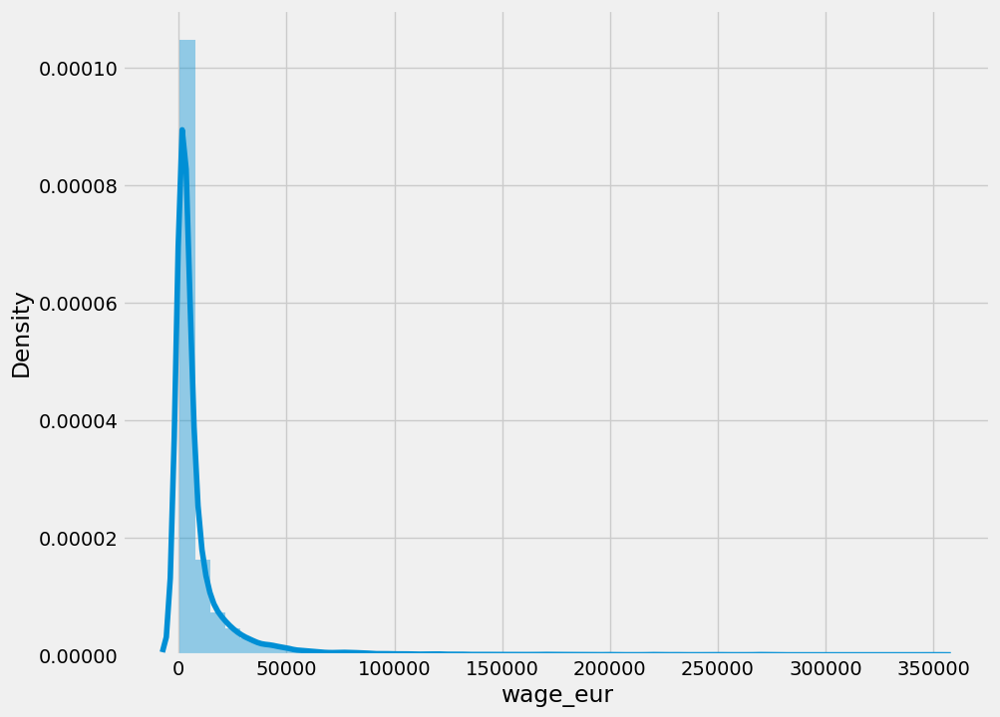

In [86]:
plt.subplots(figsize=(10,8))
sns.distplot(df.wage_eur)

In [87]:
df["wage_eur"].skew()

6.472150263300757

In [88]:
df['wage_eur'] = df['wage_eur'].fillna(df['wage_eur'].median())

<ipython-input-89-077b9188730c>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




<Axes: xlabel='pace', ylabel='Density'>

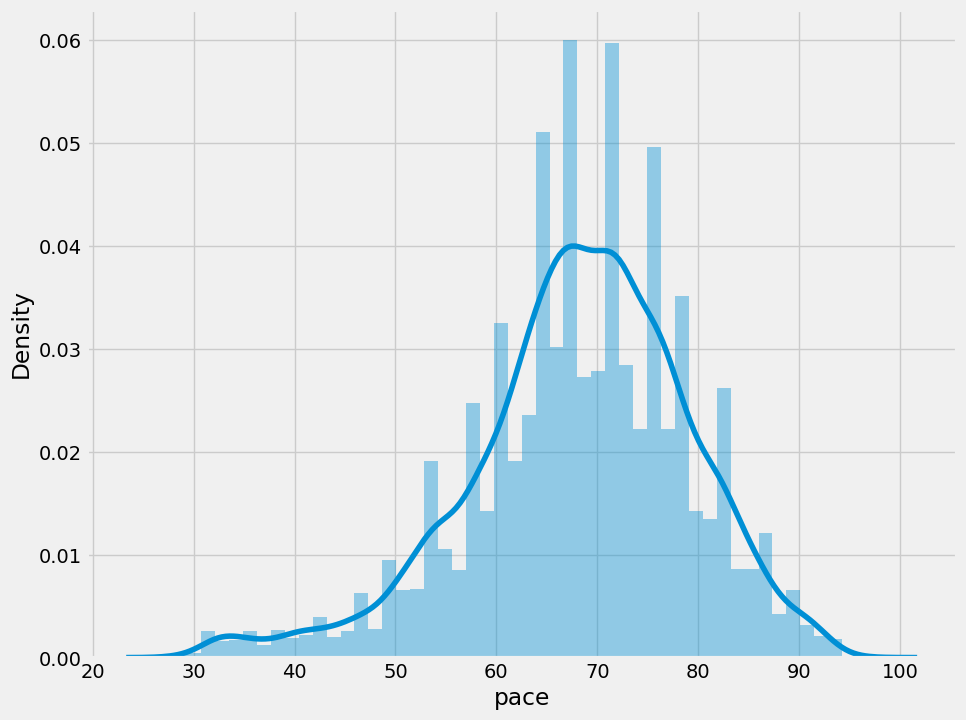

In [89]:
plt.subplots(figsize=(10,8))
sns.distplot(df.pace)

In [90]:
df["pace"].skew()

-0.5703408837405103

In [91]:
df["pace"].median()

69.0

In [92]:
df['pace'] = df['pace'].fillna(df['pace'].median())

<ipython-input-93-bced9d5ad6cf>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




<Axes: xlabel='shooting', ylabel='Density'>

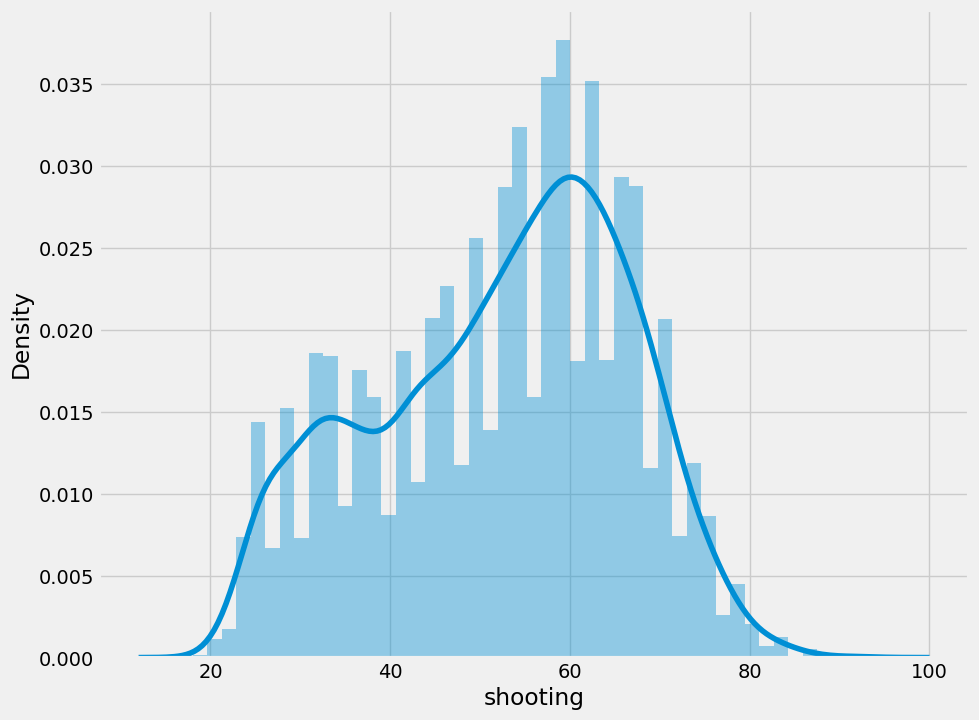

In [93]:
plt.subplots(figsize=(10,8))
sns.distplot(df.shooting)

In [94]:
df["shooting"].skew()

-0.27891311071528624

In [95]:
df["shooting"].median()

54.0

In [96]:
df['shooting'] = df['shooting'].fillna(df['shooting'].median())

<ipython-input-97-3a1fd0da0dd5>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




<Axes: xlabel='passing', ylabel='Density'>

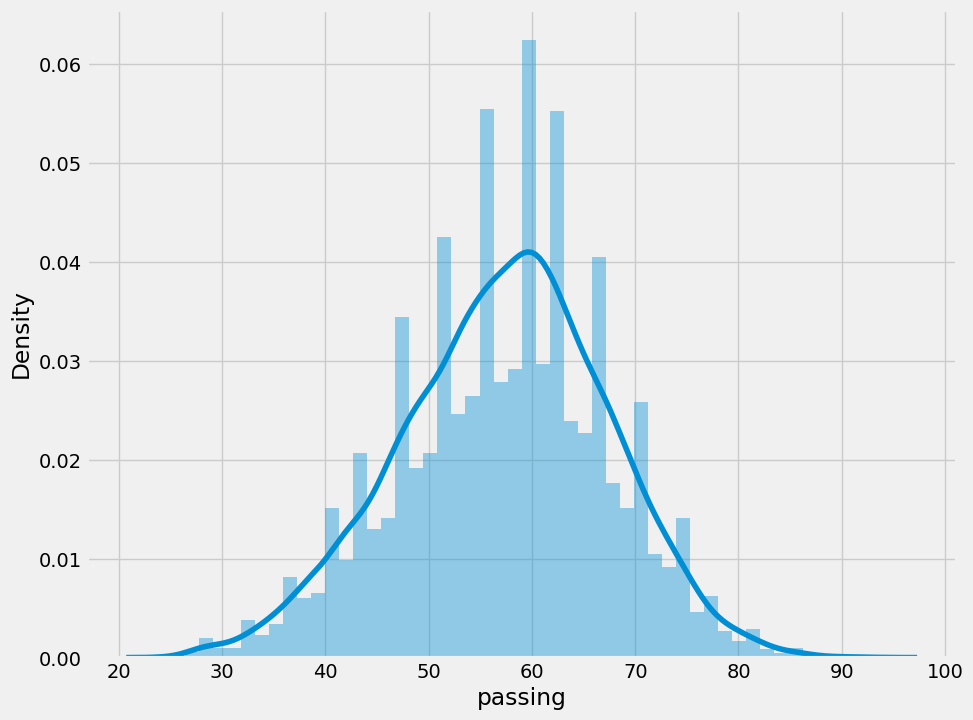

In [97]:
plt.subplots(figsize=(10,8))
sns.distplot(df.passing)

In [98]:
df["passing"].skew()

-0.1603308501355018

In [99]:
df["passing"].median()

58.0

In [100]:
df['passing'] = df['passing'].fillna(df['passing'].median())

<ipython-input-101-4eba92984951>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




<Axes: xlabel='dribbling', ylabel='Density'>

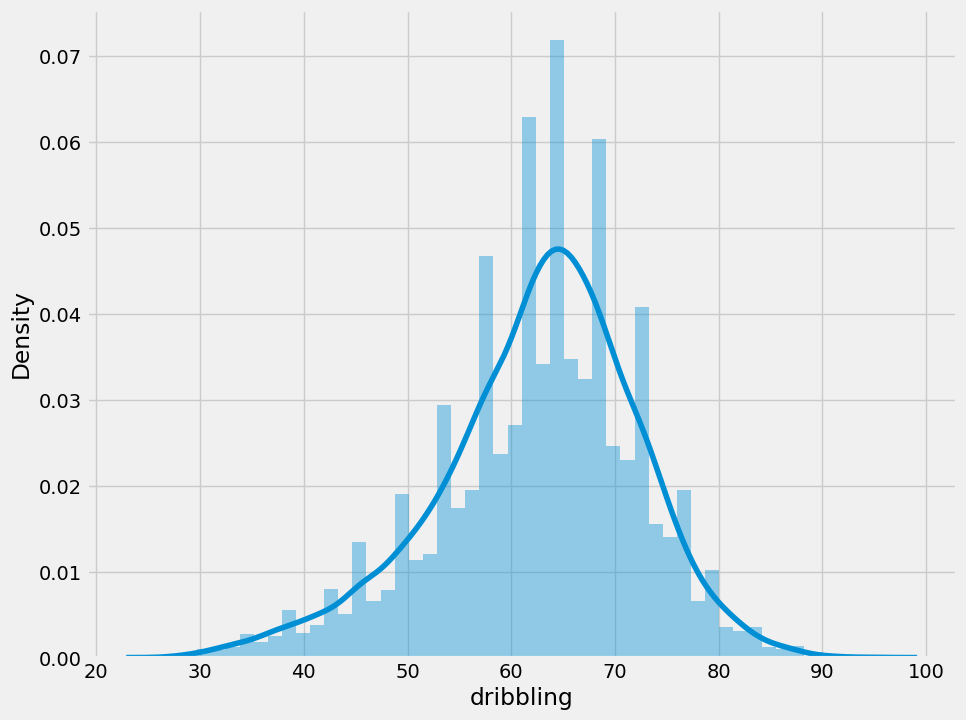

In [101]:
plt.subplots(figsize=(10,8))
sns.distplot(df.dribbling)

In [102]:
df["dribbling"].skew()

-0.4857236684056236

In [103]:
df["dribbling"].median()

64.0

In [104]:
df['dribbling'] = df['dribbling'].fillna(df['dribbling'].median())

<ipython-input-105-9839e8a6c6f3>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




<Axes: xlabel='defending', ylabel='Density'>

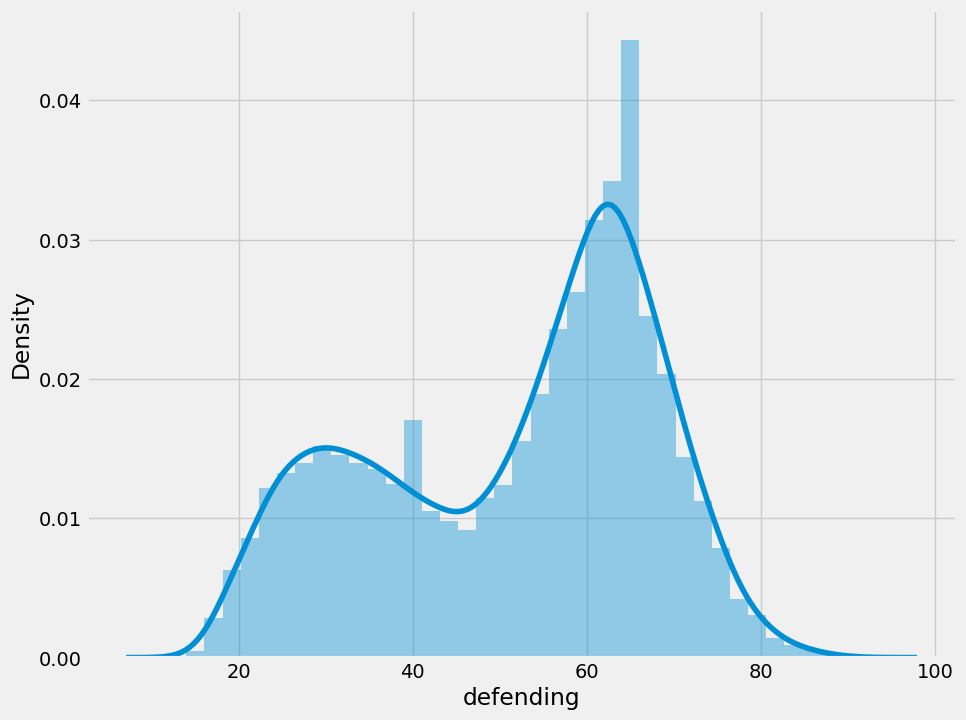

In [105]:
plt.subplots(figsize=(10,8))
sns.distplot(df.defending)

In [106]:
df["defending"].skew()

-0.405547803642739

In [107]:
df["defending"].median()

56.0

In [108]:
df['defending'] = df['defending'].fillna(df['defending'].median())

<ipython-input-109-3602ed8670b5>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




<Axes: xlabel='physic', ylabel='Density'>

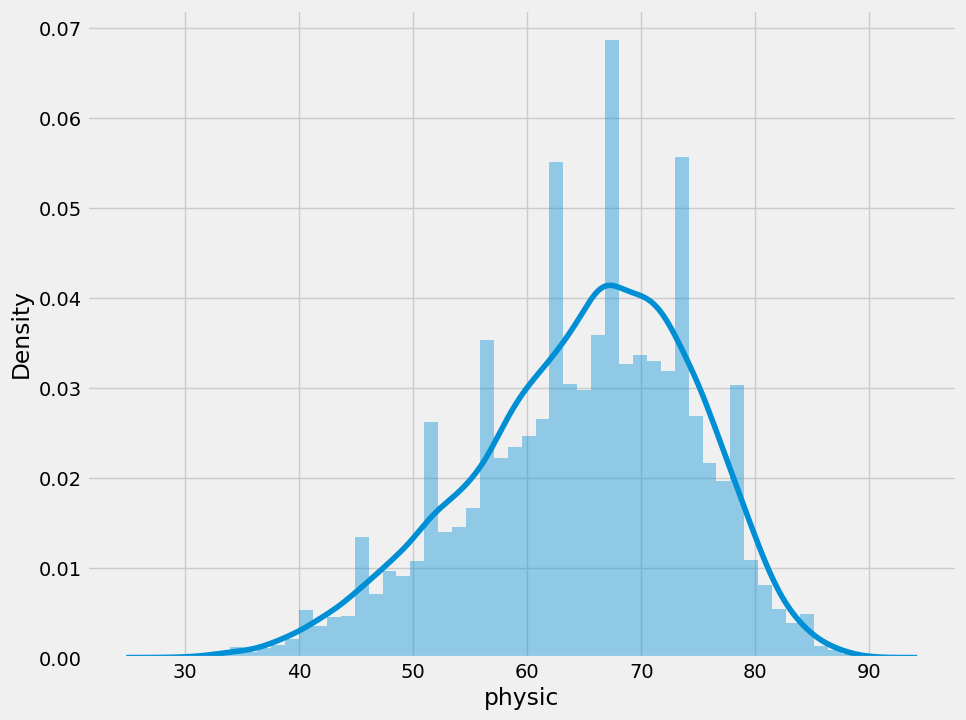

In [109]:
plt.subplots(figsize=(10,8))
sns.distplot(df.physic)

In [110]:
df["physic"].skew()

-0.45257957542999117

In [111]:
df["physic"].median()

66.0

In [112]:
df['physic'] = df['physic'].fillna(df['physic'].median())

<ipython-input-113-98f9ad3e1543>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




<Axes: xlabel='goalkeeping_speed', ylabel='Density'>

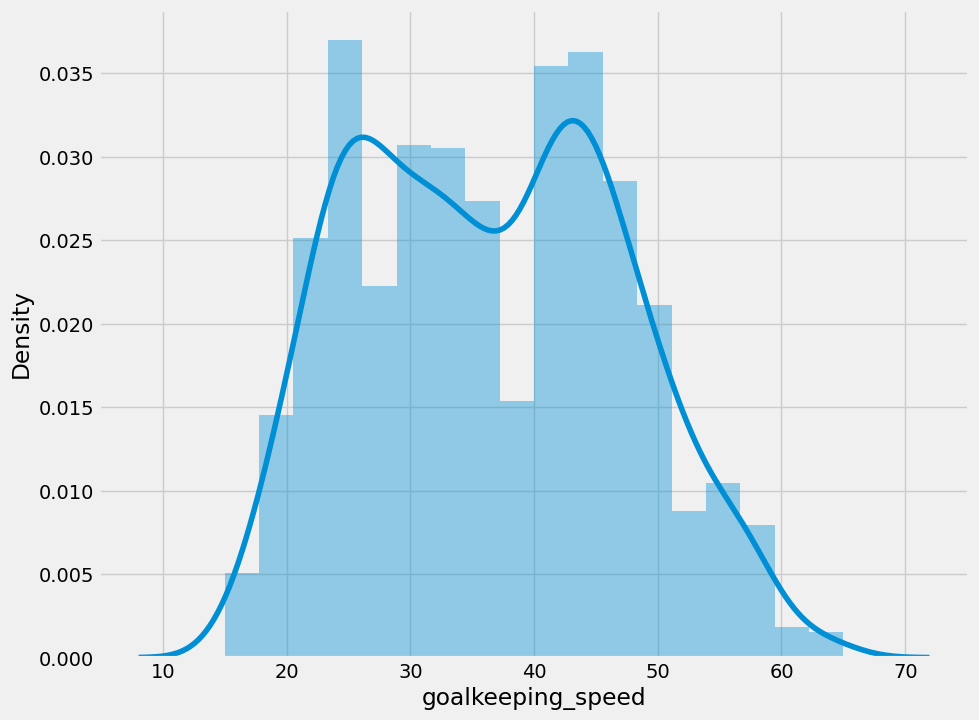

In [113]:
plt.subplots(figsize=(10,8))
sns.distplot(df.goalkeeping_speed)

In [114]:
df["goalkeeping_speed"].skew()

0.167081132952676

In [115]:
df["goalkeeping_speed"].median()

36.0

In [116]:
df['goalkeeping_speed'] = df['goalkeeping_speed'].fillna(df['goalkeeping_speed'].median())

In [117]:
df.isnull().sum()

sofifa_id           0
short_name          0
player_positions    0
overall             0
potential           0
                   ..
lcb                 0
cb                  0
rcb                 0
rb                  0
gk                  0
Length: 84, dtype: int64

**Outliers**

<Axes: >

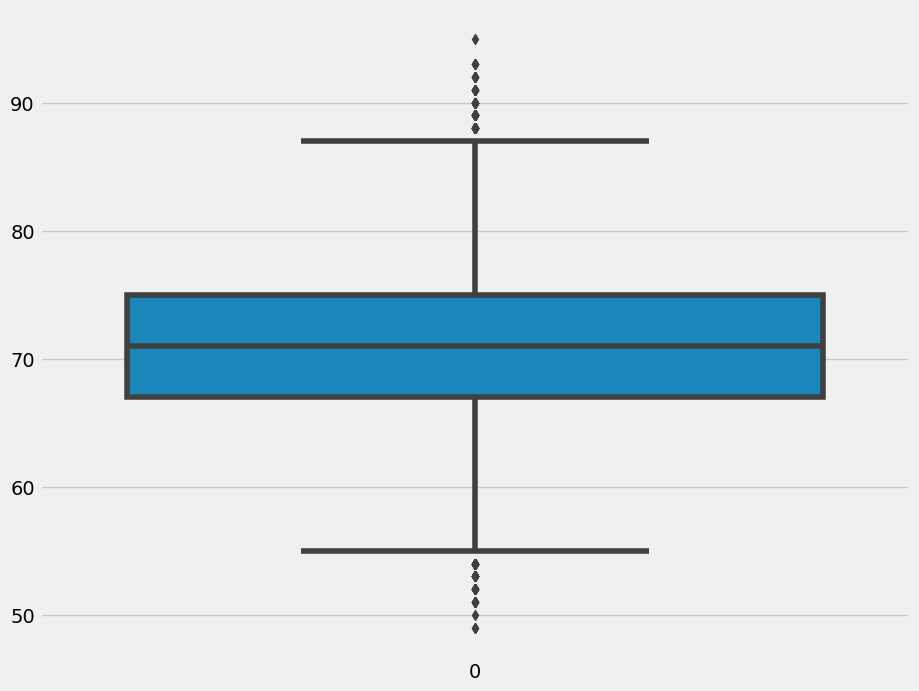

In [118]:
#Potential
plt.subplots(figsize=(10,8))
sns.boxplot(df.potential)

In [119]:
q3, q1 = np.percentile(df['potential'], [75 ,25])
iqr = float(q3 - q1)

In [120]:
def q3Iqr(col):
    return np.quantile(col, 0.75)

In [121]:
def q1Iqr(col):
    return np.quantile(col, 0.25)

In [122]:
def Iqr(q3,q1):
    return float(q3 - q1)

In [123]:
def upper(x):
   return q3Iqr(x)+1.5*iqr

In [124]:
def lower(x):
   return q1Iqr(x)-1.5*iqr

In [125]:
def replace_outlier(x):
    df[x] = np.where(
    df[x] > upper(df[x]),
    upper(df[x]),
    np.where(
        df[x] < lower(df[x]),
        lower(df[x]),
        df[x]
    )
)

In [126]:
replace_outlier('potential')

<Axes: >

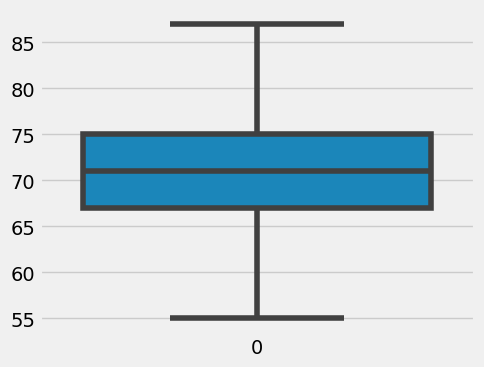

In [127]:
plt.subplots(figsize=(5,4))
sns.boxplot(df.potential)

In [128]:
def find_outliers_IQR(df):
   q1=df.quantile(0.25)
   q3=df.quantile(0.75)
   IQR=q3-q1
   outliers = df[((df<(q1-1.5*IQR)) | (df>(q3+1.5*IQR)))]
   return outliers

In [129]:
outliers = find_outliers_IQR(df['potential'])

In [130]:
def drop_outliers_IQR(df):
   q1=df.quantile(0.25)
   q3=df.quantile(0.75)
   IQR=q3-q1
   not_outliers = df[~((df<(q1-1.5*IQR)) | (df>(q3+1.5*IQR)))]
   outliers_dropped = not_outliers.dropna().reset_index()
   return outliers_dropped

In [131]:
drop_outliers_IQR(df['potential']).count()

index        19239
potential    19239
dtype: int64

**One** **hot** **encoding**


In [132]:
dummies = df.player_positions.str.split('\s*,\s*', expand=True).stack().str.get_dummies().sum(level=0)

<ipython-input-132-7e2b985ff871>:1: FutureWarning:

Using the level keyword in DataFrame and Series aggregations is deprecated and will be removed in a future version. Use groupby instead. df.sum(level=1) should use df.groupby(level=1).sum().



In [133]:
df = pd.concat([df, dummies], axis=1)

In [134]:
df.head()

,sofifa_id,short_name,player_positions,overall,potential,value_eur,wage_eur,age,height_cm,weight_kg,...,GK,LB,LM,LW,LWB,RB,RM,RW,RWB,ST
0,158023,L. Messi,"RW, ST, CF",93,87.0,78000000.0,320000.0,34,170,72,...,0,0,0,0,0,0,0,1,0,1
1,188545,R. Lewandowski,ST,92,87.0,119500000.0,270000.0,32,185,81,...,0,0,0,0,0,0,0,0,0,1
2,20801,Cristiano Ronaldo,"ST, LW",91,87.0,45000000.0,270000.0,36,187,83,...,0,0,0,1,0,0,0,0,0,1
3,190871,Neymar Jr,"LW, CAM",91,87.0,129000000.0,270000.0,29,175,68,...,0,0,0,1,0,0,0,0,0,0
4,192985,K. De Bruyne,"CM, CAM",91,87.0,125500000.0,350000.0,30,181,70,...,0,0,0,0,0,0,0,0,0,0


In [135]:
def draw_box_plot(x):
    plt.subplots(figsize=(3,3))
    sns.boxplot(df[x])

In [136]:
def draw_dist_plot(x):
    plt.subplots(figsize=(3,3))
    sns.distplot(df[x])

In [137]:
df2 = df[['attacking_crossing','attacking_finishing','attacking_heading_accuracy','attacking_short_passing',
         'attacking_volleys','skill_dribbling','skill_curve','skill_fk_accuracy','skill_long_passing',
         'skill_ball_control','movement_acceleration','movement_sprint_speed','movement_agility', 'movement_reactions', 'movement_balance', 'power_shot_power', 'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots', 'mentality_aggression', 'mentality_interceptions', 'mentality_positioning', 'mentality_vision', 'mentality_penalties', 'mentality_composure', 'defending_marking_awareness', 'defending_standing_tackle', 'defending_sliding_tackle', 'goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking', 'goalkeeping_positioning', 'goalkeeping_reflexes']]
df2.head()

,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,...,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
0,85,95,70,91,88,96,93,94,91,96,...,75,96,20,35,24,6,11,15,14,8
1,71,95,90,85,89,85,79,85,70,88,...,90,88,35,42,19,15,6,12,8,10
2,87,95,90,80,86,88,81,84,77,88,...,88,95,24,32,24,7,11,15,14,11
3,85,83,63,86,86,95,88,87,81,95,...,93,93,35,32,29,9,9,15,15,11
4,94,82,55,94,82,88,85,83,93,91,...,83,89,68,65,53,15,13,5,10,13


<ipython-input-136-bda464a87443>:3: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


<ipython-input-136-bda464a87443>:3: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


<ipython-input-136-bda464a87443>:3: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use

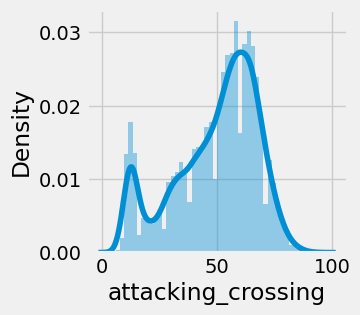

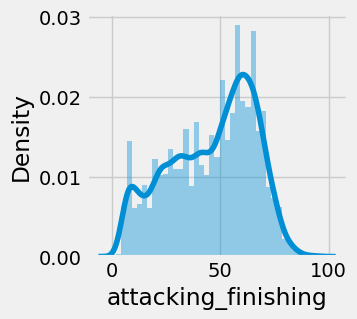

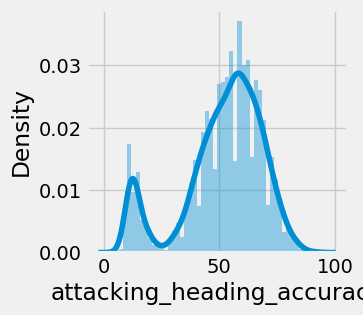

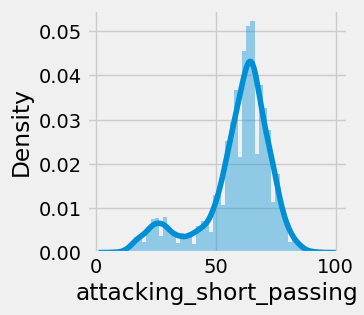

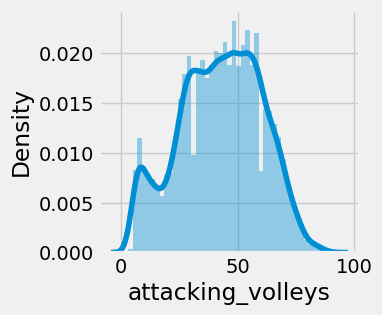

...

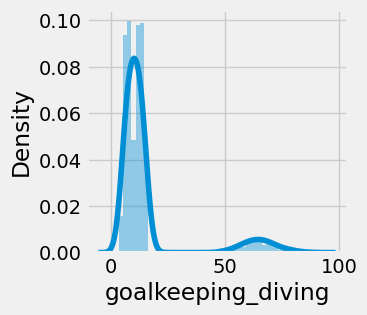

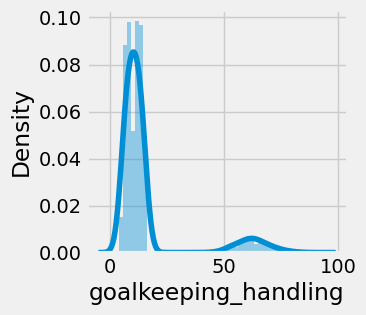

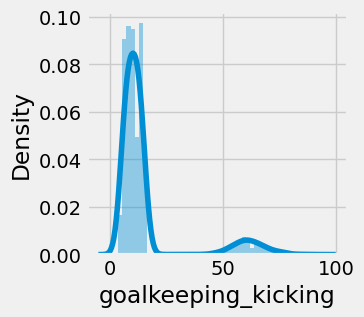

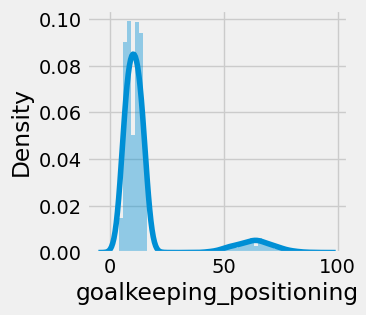

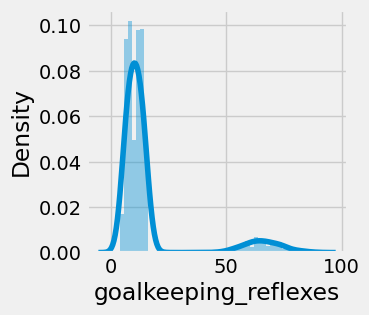

In [138]:
for i in df2:
    draw_dist_plot(i)

In [139]:
for i in df2:
    replace_outlier(i)

In [140]:
df3 = df[['attacking_crossing','attacking_finishing','attacking_heading_accuracy','attacking_short_passing',
         'attacking_volleys','skill_dribbling','skill_curve','skill_fk_accuracy','skill_long_passing',
         'skill_ball_control','movement_acceleration','movement_sprint_speed','movement_agility', 'movement_reactions', 'movement_balance', 'power_shot_power', 'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots', 'mentality_aggression', 'mentality_interceptions', 'mentality_positioning', 'mentality_vision', 'mentality_penalties', 'mentality_composure', 'defending_marking_awareness', 'defending_standing_tackle', 'defending_sliding_tackle', 'goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking', 'goalkeeping_positioning', 'goalkeeping_reflexes']]
df3.head()

,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,...,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
0,75.0,74.0,70.0,80.0,68.0,80.0,73.0,67.0,76.0,81.0,...,72.0,78.0,20.0,35.0,24.0,6.0,11.0,15.0,14.0,8.0
1,71.0,74.0,76.0,80.0,68.0,80.0,73.0,67.0,70.0,81.0,...,72.0,78.0,35.0,42.0,19.0,15.0,6.0,12.0,8.0,10.0
2,75.0,74.0,76.0,80.0,68.0,80.0,73.0,67.0,76.0,81.0,...,72.0,78.0,24.0,32.0,24.0,7.0,11.0,15.0,14.0,11.0
3,75.0,74.0,63.0,80.0,68.0,80.0,73.0,67.0,76.0,81.0,...,72.0,78.0,35.0,32.0,29.0,9.0,9.0,15.0,15.0,11.0
4,75.0,74.0,55.0,80.0,68.0,80.0,73.0,67.0,76.0,81.0,...,72.0,78.0,68.0,65.0,53.0,15.0,13.0,5.0,10.0,13.0


<ipython-input-135-8b72dd9bbc79>:2: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



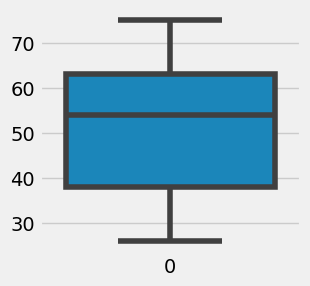

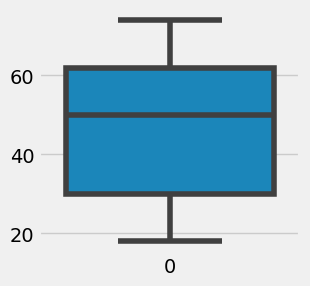

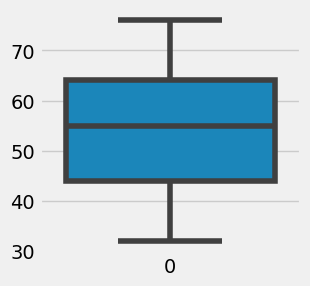

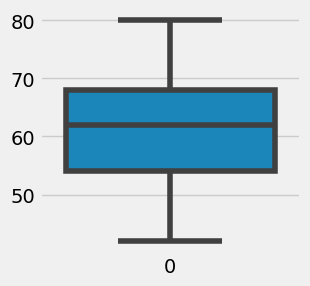

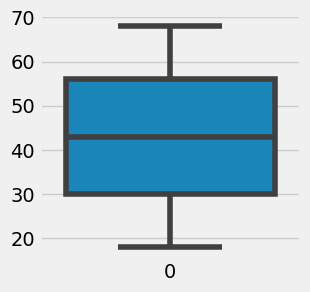

...

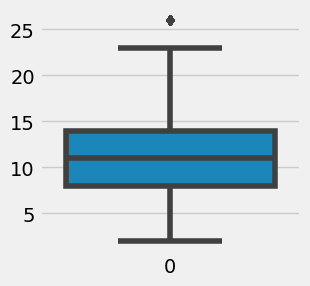

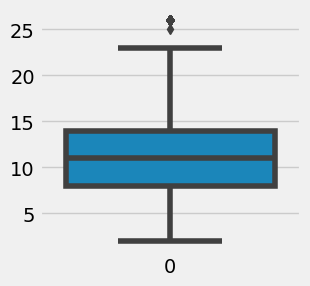

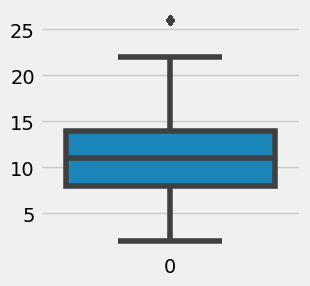

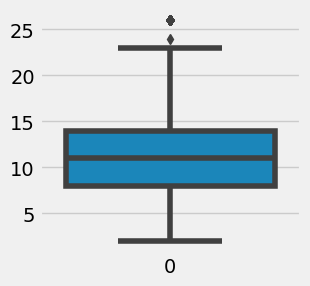

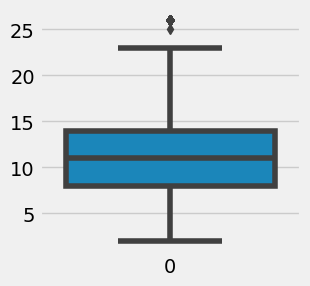

In [141]:
for i in df3:
    draw_box_plot(i)

<ipython-input-136-bda464a87443>:3: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


<ipython-input-136-bda464a87443>:3: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


<ipython-input-136-bda464a87443>:3: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use

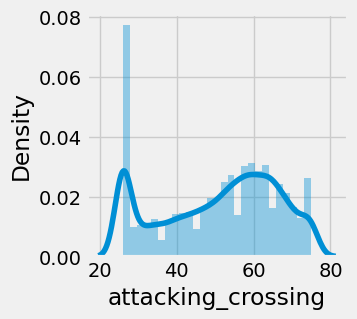

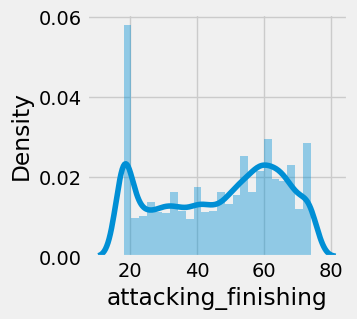

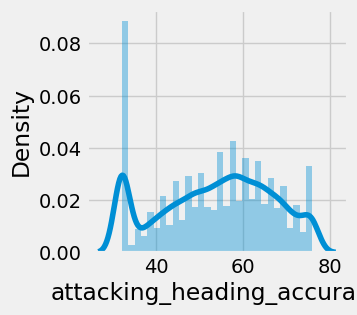

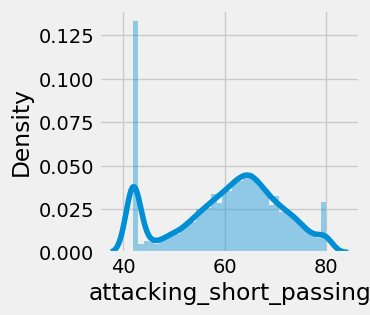

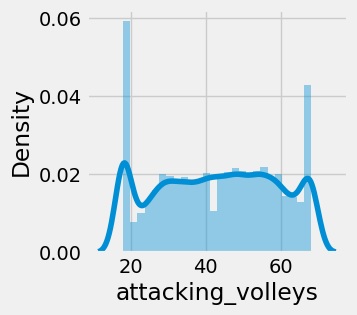

...

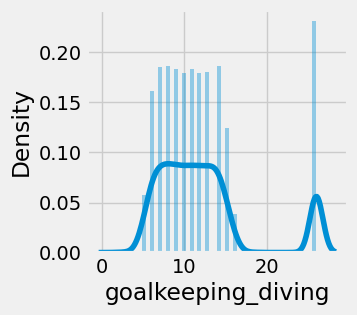

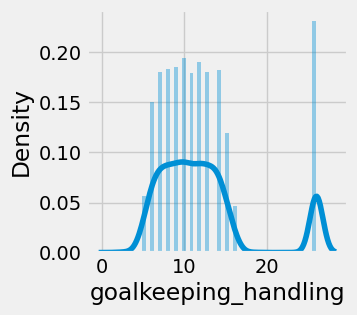

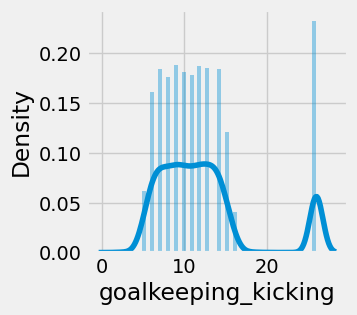

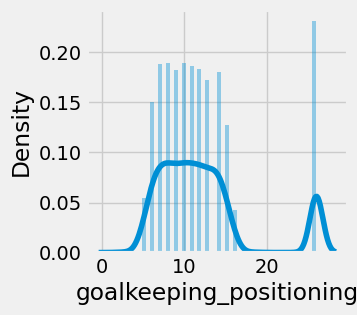

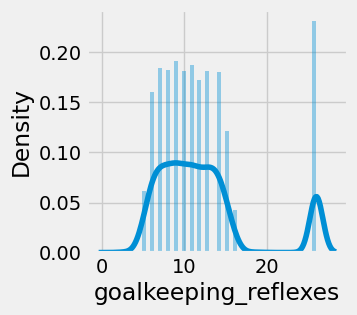

In [142]:
for i in df3:
    draw_dist_plot(i)

**ANOVA** **test** **for** **finding** **relationship** **between** **player** **position** **and** **overall**

In [143]:
from scipy.stats import f_oneway
CategoryGroupLists=df.groupby('player_positions')['overall'].apply(list)
AnovaResults = f_oneway(*CategoryGroupLists)
print('P-Value for Anova is: ', AnovaResults[1])

P-Value for Anova is:  5.1049884279197476e-76


In [145]:
df = df.drop(['release_clause_eur','player_positions'],axis=1)
df.head()

,sofifa_id,short_name,overall,potential,value_eur,wage_eur,age,height_cm,weight_kg,weak_foot,...,GK,LB,LM,LW,LWB,RB,RM,RW,RWB,ST
0,158023,L. Messi,93,87.0,78000000.0,320000.0,34,170,72,4,...,0,0,0,0,0,0,0,1,0,1
1,188545,R. Lewandowski,92,87.0,119500000.0,270000.0,32,185,81,4,...,0,0,0,0,0,0,0,0,0,1
2,20801,Cristiano Ronaldo,91,87.0,45000000.0,270000.0,36,187,83,4,...,0,0,0,1,0,0,0,0,0,1
3,190871,Neymar Jr,91,87.0,129000000.0,270000.0,29,175,68,5,...,0,0,0,1,0,0,0,0,0,0
4,192985,K. De Bruyne,91,87.0,125500000.0,350000.0,30,181,70,5,...,0,0,0,0,0,0,0,0,0,0


In [146]:
y= df['overall']
x = df.drop(['overall','sofifa_id','short_name','work_rate','body_type'],axis=1)

In [147]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x, y,random_state=100, test_size=0.3)   

**Using** **pearson** **correlation**

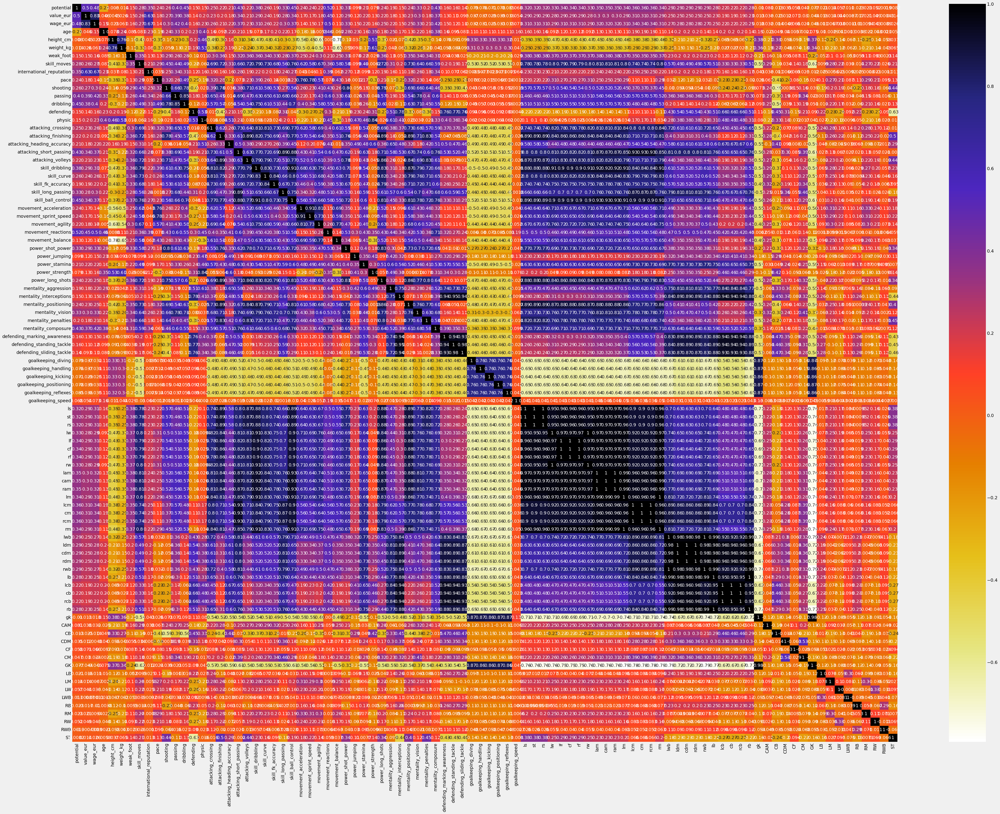

In [148]:
cor = X_train.corr()
plt.figure(figsize=(52,40))
sns.heatmap(cor, cmap=plt.cm.CMRmap_r,annot=True)
plt.show() 

In [149]:
def correlation(dataset, threshold):
    col_corr = set()
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold:
                colname = corr_matrix.columns[i]
                col_corr.add(colname)
    return col_corr

In [150]:
corr_features = correlation(X_train, 0.9)
corr_features

{'GK',
 'cam',
 'cb',
 'cdm',
 'cf',
 'cm',
 'defending_marking_awareness',
 'defending_sliding_tackle',
 'defending_standing_tackle',
 'lam',
 'lb',
 'lcb',
 'lcm',
 'ldm',
 'lf',
 'lm',
 'lw',
 'movement_sprint_speed',
 'ram',
 'rb',
 'rcb',
 'rcm',
 'rdm',
 'rf',
 'rm',
 'rs',
 'rw',
 'rwb',
 'skill_ball_control',
 'st'}

**Chi** **Square**

In [151]:
from sklearn.feature_selection import chi2

In [152]:
f_p_values=chi2(X_train,y_train)
f_p_values

(array([3.04853931e+03, 2.38523788e+11, 4.45703913e+08, 2.97546709e+03,
        1.97261309e+01, 2.45726134e+02, 1.10373292e+02, 4.98826480e+02,
        9.15283485e+02, 6.43681933e+02, 9.36405943e+03, 9.24306302e+03,
        6.73818002e+03, 6.19213527e+03, 4.45371999e+03, 1.17119626e+04,
        1.09041385e+04, 7.29825441e+03, 9.37175753e+03, 1.08484128e+04,
        8.35768233e+03, 1.32571192e+04, 1.03883687e+04, 1.15599813e+04,
        9.15597486e+03, 1.02212929e+03, 1.16640863e+03, 2.60325577e+03,
        1.21738424e+04, 5.72349176e+02, 1.14687201e+04, 2.29587273e+03,
        6.23318604e+03, 4.20102408e+03, 1.53410744e+04, 9.56211347e+03,
        1.17453388e+04, 9.60391131e+03, 1.07957728e+04, 6.33657784e+03,
        1.46991516e+04, 1.01934166e+04, 8.22782946e+03, 7.08827335e+03,
        2.43082921e+02, 2.48039361e+02, 2.09308473e+02, 1.93582398e+02,
        2.27238603e+02, 1.77668708e+02, 1.08475679e+04, 1.08475679e+04,
        1.08475679e+04, 1.00243440e+04, 1.07794452e+04, 1.077944

In [153]:
p_values=pd.Series(f_p_values[1])
p_values.index=X_train.columns
p_values
p_values.sort_index(ascending=False)

weight_kg    1.859404e-29
weak_foot    2.051081e-07
wage_eur     0.000000e+00
value_eur    0.000000e+00
st           0.000000e+00
                 ...     
CM           6.682559e-02
CF           3.995492e-15
CDM          7.839783e-06
CB           8.419183e-01
CAM          3.877406e-03
Length: 92, dtype: float64

**Mutual** **Information** **Gain**

In [154]:
from sklearn.feature_selection import mutual_info_classif
mutual_info = mutual_info_classif(X_train, y_train)
mutual_info

array([8.42733019e-01, 1.29728559e+00, 6.32932569e-01, 1.70600672e-01,
       3.13355031e-03, 1.21978250e-02, 2.66881593e-02, 1.04066914e-01,
       1.37206240e-01, 4.85761190e-02, 2.59005620e-01, 3.84106783e-01,
       4.14931150e-01, 4.09341164e-01, 1.58782589e-01, 2.57186445e-01,
       1.49479685e-01, 1.76933783e-01, 4.28587267e-01, 1.60449503e-01,
       3.31554981e-01, 2.00444653e-01, 1.07456650e-01, 2.46163372e-01,
       4.80500111e-01, 3.61145946e-02, 4.18861192e-02, 5.09211799e-02,
       7.73835309e-01, 9.00004367e-03, 2.66808653e-01, 5.97247336e-02,
       1.56436854e-01, 7.94394373e-02, 2.34838918e-01, 1.47872169e-01,
       3.72075866e-01, 2.87078246e-01, 2.54843731e-01, 9.23464443e-02,
       4.52039283e-01, 2.93645063e-01, 3.08756283e-01, 2.82094683e-01,
       2.45000549e-03, 1.76644769e-02, 1.77589560e-02, 9.41750984e-03,
       1.72510248e-02, 2.55048809e-02, 5.67870151e-01, 5.58117930e-01,
       5.39220940e-01, 4.55282926e-01, 4.66267569e-01, 4.77340068e-01,
      

In [155]:
mutual_info = pd.Series(mutual_info)
mutual_info.index = X_train.columns
mutual_info.sort_values(ascending=False)

value_eur             1.297286
potential             0.842733
movement_reactions    0.773835
rb                    0.656123
rm                    0.654878
                        ...   
CF                    0.000000
LW                    0.000000
RB                    0.000000
RM                    0.000000
CB                    0.000000
Length: 92, dtype: float64

In [156]:
from sklearn.datasets import make_regression
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression

In [157]:
# define feature selection
fs = SelectKBest(score_func=f_regression, k=35)

In [158]:
# apply feature selection
X_selected = fs.fit_transform(x, y)
print(X_selected.shape)

(19239, 35)


In [159]:
X_selected

array([[8.700e+01, 7.800e+07, 3.200e+05, ..., 6.700e+01, 6.700e+01,
        6.900e+01],
       [8.700e+01, 1.195e+08, 2.700e+05, ..., 6.900e+01, 6.900e+01,
        6.700e+01],
       [8.700e+01, 4.500e+07, 2.700e+05, ..., 6.200e+01, 6.200e+01,
        6.600e+01],
       ...,
       [5.500e+01, 1.000e+05, 5.000e+02, ..., 4.800e+01, 4.800e+01,
        4.900e+01],
       [6.000e+01, 1.100e+05, 5.000e+02, ..., 3.100e+01, 3.100e+01,
        3.500e+01],
       [6.000e+01, 1.100e+05, 5.000e+02, ..., 4.600e+01, 4.600e+01,
        4.700e+01]])

In [160]:
filter = fs.get_support()
vector_names = list(x.columns[fs.get_support(indices=True)])
print(vector_names)

['potential', 'value_eur', 'wage_eur', 'age', 'international_reputation', 'passing', 'dribbling', 'physic', 'attacking_short_passing', 'skill_dribbling', 'skill_long_passing', 'skill_ball_control', 'movement_reactions', 'power_shot_power', 'mentality_vision', 'mentality_composure', 'ls', 'st', 'rs', 'lf', 'cf', 'rf', 'lam', 'cam', 'ram', 'lm', 'lcm', 'cm', 'rcm', 'rm', 'lwb', 'ldm', 'cdm', 'rdm', 'rwb']


In [161]:
df.head()

,sofifa_id,short_name,overall,potential,value_eur,wage_eur,age,height_cm,weight_kg,weak_foot,...,GK,LB,LM,LW,LWB,RB,RM,RW,RWB,ST
0,158023,L. Messi,93,87.0,78000000.0,320000.0,34,170,72,4,...,0,0,0,0,0,0,0,1,0,1
1,188545,R. Lewandowski,92,87.0,119500000.0,270000.0,32,185,81,4,...,0,0,0,0,0,0,0,0,0,1
2,20801,Cristiano Ronaldo,91,87.0,45000000.0,270000.0,36,187,83,4,...,0,0,0,1,0,0,0,0,0,1
3,190871,Neymar Jr,91,87.0,129000000.0,270000.0,29,175,68,5,...,0,0,0,1,0,0,0,0,0,0
4,192985,K. De Bruyne,91,87.0,125500000.0,350000.0,30,181,70,5,...,0,0,0,0,0,0,0,0,0,0


In [162]:
from scipy.stats import pearsonr
corr, _ = pearsonr(df['value_eur'], df['overall'])
print('Pearsons correlation: %.3f' % corr)

Pearsons correlation: 0.553


In [163]:
corr, _ = pearsonr(df['wage_eur'], df['overall'])
print('Pearsons correlation: %.3f' % corr)

Pearsons correlation: 0.600


**Work** **rate** **vs** **Overall**

In [164]:
from scipy.stats import f_oneway
CategoryGroupLists=df.groupby('work_rate')['overall'].apply(list)
AnovaResults = f_oneway(*CategoryGroupLists)
print('P-Value for Anova work_rate is: ', AnovaResults[1])

P-Value for Anova work_rate is:  1.1816178962615241e-271


**Body** **type** **vs** **Overall**

In [165]:
from scipy.stats import f_oneway
CategoryGroupLists=df.groupby('body_type')['overall'].apply(list)
AnovaResults = f_oneway(*CategoryGroupLists)
print('P-Value for Anova body_type is: ', AnovaResults[1])

P-Value for Anova body_type is:  1.7082097229486502e-271


In [166]:
df = df.drop(['sofifa_id','short_name','work_rate','body_type'],axis=1)

In [167]:
df.drop("overall", axis=1).apply(lambda x: x.corr(df.overall)).sort_values(ascending=False)

movement_reactions         0.871825
mentality_composure        0.729534
passing                    0.661771
potential                  0.641798
attacking_short_passing    0.615792
                             ...   
goalkeeping_reflexes      -0.036494
goalkeeping_positioning   -0.037629
goalkeeping_handling      -0.038217
goalkeeping_diving        -0.038523
GK                        -0.069393
Length: 92, dtype: float64

In [168]:
df_model = df[['overall','wage_eur','value_eur','potential','attacking_crossing','attacking_finishing','attacking_heading_accuracy','attacking_short_passing',
         'attacking_volleys','skill_dribbling','skill_curve','skill_fk_accuracy','skill_long_passing',
         'skill_ball_control','movement_acceleration','movement_sprint_speed','movement_agility', 'movement_reactions', 'movement_balance', 'power_shot_power', 'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots', 'mentality_aggression', 'mentality_interceptions', 'mentality_positioning', 'mentality_vision', 'mentality_penalties', 'mentality_composure', 'defending_marking_awareness', 'defending_standing_tackle', 'defending_sliding_tackle', 'goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking', 'goalkeeping_positioning', 'goalkeeping_reflexes']]

In [169]:
Y= df_model['overall']
X = df_model.drop(['overall'],axis=1)

In [170]:
X_train_data, X_test_data, y_train_data, y_test_data = train_test_split(X, Y,random_state=100, test_size=0.3)

**Random** **Forest** **Regression**

In [171]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
forest_reg = RandomForestRegressor()
forest_reg.fit(X_train_data, y_train_data)
y_predictions = forest_reg.predict(X_test_data)
forest_mse = mean_squared_error(y_test_data, y_predictions)
forest_rmse = np.sqrt(forest_mse)
forest_rmse

1.104242205734706

**Decision** **Tree**

In [172]:
from sklearn.tree import DecisionTreeRegressor
regr = DecisionTreeRegressor(max_depth=2)
regr.fit(X_train_data, y_train_data)
ypred = regr.predict(X_test_data)
mse = mean_squared_error(y_test_data, ypred)
rmse= np.sqrt(mse)
rmse

3.620344233129416

**Support** **Vector**

In [173]:
from sklearn.svm import SVR
svr = SVR().fit(X_train_data,y_train_data)
ysvrpred = svr.predict(X_test_data)
mse_svr = mean_squared_error(y_test_data, ysvrpred)
rmse_svr= np.sqrt(mse_svr)
rmse_svr

3.5036848098435653

Lasso Regressor

In [174]:
from sklearn import linear_model
lassoReg = linear_model.Lasso(alpha=0.1)
lassoReg.fit(X_train_data,y_train_data)
ylassopred = lassoReg.predict(X_test_data)
mse_lasso = mean_squared_error(y_test_data, ylassopred)
rmse_lasso= np.sqrt(mse_lasso)
rmse_lasso

2.3064665362460173

**Polynomial**

In [175]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
poly_regs= PolynomialFeatures(degree= 2)  
x_poly= poly_regs.fit_transform(X_train_data)  
lin_reg_2 =LinearRegression()  
lin_reg_2.fit(x_poly, y_train_data)  
y_pred = lin_reg_2.predict(poly_regs.fit_transform(X_test_data))
mse = mean_squared_error(y_test_data, y_pred)
rmse = np.sqrt(mse)
rmse

2.473784258918258

**Gradient** **Boosting**

In [177]:
from sklearn.ensemble import GradientBoostingRegressor
gbr = GradientBoostingRegressor(n_estimators=600,max_depth=5,learning_rate=0.01,min_samples_split=3)
gbr = GradientBoostingRegressor()
gbr.fit(X_train_data, y_train_data)
ypred = gbr.predict(X_test_data)
mse = mean_squared_error(y_test_data,ypred)
rmse = np.sqrt(mse)
rmse

1.3894967700157086

Random Forest Regression chosen as the final model for predicting the player ratings. Because it has least RMSE (1.10).


In [179]:
import pickle
model_pkl = open('model7.pkl','wb')
pickle.dump(forest_reg,model_pkl)
model_pkl.close()